source: https://github.com/vectorkoz/economic-presidential 

this notebook contains the full code for the "PREDICTING 2020 U.S. PRESIDENTIAL ELECTION RESULTS BY STATE" project

only rudimentary comments are present here. Read the full report on github.

## IMPORTING LIBRARIES & DATA 

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedShuffleSplit, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import f1_score, roc_auc_score, accuracy_score, balanced_accuracy_score
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Polygon
from matplotlib.patches import Patch
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import permutation_importance

In [2]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

defining the random state variable

In [3]:
rs = 123

functions for choropleth

In [4]:
def get_color(value):
    if value==0:
        return '#ff0000'
    if value==1:
        return '#ff7f7f'
    if value==10:
        return '#7f7fff'
    if value==11:
        return '#0000ff'
    return '#000000'

In [5]:
def get_color_vs_winner(value):
    if value==0:
        return '#00ff00'
    if value==1:
        return '#7fff7f'
    if value==10:
        return '#ff7f7f'
    if value==11:
        return '#ff0000'
    return '#000000'

In [6]:
gdf = gpd.read_file('data/cb_2018_us_state_500k')
gdf=gdf[~(gdf.NAME.isin(['Puerto Rico',
                                  'American Samoa',
                                  'United States Virgin Islands',
                                  'Commonwealth of the Northern Mariana Islands',
                                  'Guam']))]

In [7]:
def show_result(target_name, y_pred, model_name, gdf=gdf):
    # create a DataFrame storing results of the model
    results=pd.DataFrame()
    results['state']=[x[6:] for x in X_test.columns[-51:]]
    results['prediction']=y_pred
    results['actual']=y_test_df[target_name]
    # assign color to the results 
    results['color']=10*results['actual']+1*results['prediction']
    if target_name=='winner_vs_national_winner' or target_name=='winner_vs_national_pv_winner':
        results.color=results.color.apply(get_color_vs_winner)
    else:
        results.color=results.color.apply(get_color)
    # merge results with the GeoDataFrame storing state borders
    visframe = gdf.merge(results,left_on='NAME',right_on='state')
    visframe = visframe.to_crs(epsg=2163)
    
    # create figure and axes for Matplotlib
    fig, ax = plt.subplots(1, figsize=(18, 14))
    # remove the axis box around the vis
    ax.axis('off')
    # add a title and annotation
    ax.set_title(target_name+': 2020 predictions\n'+model_name, fontdict={'fontsize': '42', 'fontweight' : '1'})
    
    # create map of the lower 48 states
    for row in visframe.itertuples():
        if row.STUSPS not in ['AK','HI','DC']:
            vf = visframe[visframe.STUSPS==row.STUSPS]
            c = vf.color
            vf.plot(color=c, linewidth=0.8, ax=ax, edgecolor='0.8')
            # add shortened state name
            if row.STUSPS in ['UT','IN', 'NH', 'AL','IL','CT','ME','IA','AR','KY','NC','SC','PA','NY']:
                x_text=vf.geometry.iloc[0].centroid.x-50000
            elif row.STUSPS in ['MI', 'NJ', 'MD','DE','FL','RI','VA']:
                x_text=vf.geometry.iloc[0].centroid.x
            else:
                x_text=vf.geometry.iloc[0].centroid.x-100000
                
            if row.STUSPS in ['MO','KY', 'TN','CT','RI','IA','AR','WV','DE','OH','NJ']:
                y_text=vf.geometry.iloc[0].centroid.y-50000
            elif row.STUSPS in ['MD', 'MI']:
                y_text=vf.geometry.iloc[0].centroid.y-100000
            else:
                y_text=vf.geometry.iloc[0].centroid.y
            ax.text(x=x_text, y=y_text, s=row.STUSPS, fontsize=20, fontweight='bold')
    
    # add a bigger square to the map instead of DC borders to make DC visible
    dc_gdf = visframe[visframe.STUSPS=='DC']
    dc_x_poly=dc_gdf.geometry.iloc[0].centroid.x
    dc_x_text=dc_x_poly-100000
    dc_y=dc_gdf.geometry.iloc[0].centroid.y
    offset=30000
    dc_gdf.geometry.iloc[0]=Polygon([(dc_x_poly-offset,dc_y-offset),(dc_x_poly-offset,dc_y+offset),
                                     (dc_x_poly+offset,dc_y+offset),(dc_x_poly+offset,dc_y-offset)])
    dc_gdf.plot(color=dc_gdf.color.iloc[0], linewidth=0.8, ax=ax, edgecolor='0.8')
    ax.text(x=dc_x_text, y=dc_y+30000, s='DC', fontsize=20, fontweight='bold')
    
    # add Alaska on a separate axis
    akax = fig.add_axes([0.1, 0.17, 0.2, 0.19])
    akax.axis('off')
    # polygon to clip some Aleutian islands for better visibility
    polygon = Polygon([(-4000000,1400000),(-4000000, 4000000),(-1500000, 4000000),(-1500000, 1400000)])
    alaska_gdf = visframe[visframe.STUSPS=='AK']
    alaska_gdf=alaska_gdf.clip(polygon)
    alaska_gdf.geometry=alaska_gdf.geometry.rotate(angle=45)
    alaska_gdf.plot(color=alaska_gdf.color, linewidth=0.8,ax=akax, edgecolor='0.8')
    akax.text(x=alaska_gdf.geometry.iloc[0].centroid.x-150000, y=alaska_gdf.geometry.iloc[0].centroid.y, 
              s='AK', fontsize=20, fontweight='bold')
    
    # add Hawaii on a separate axis
    hiax = fig.add_axes([.28, 0.20, 0.1, 0.1])
    hiax.axis('off')
    # polygon to clip Northwestern Hawaiian Islands for better visibility
    hipolygon = Polygon([(-6000000,-1200000),(-6000000,-400000),(-5000000, -400000),(-5000000,-1200000)])
    hawaii_gdf = visframe[visframe.STUSPS=='HI']
    hawaii_gdf=hawaii_gdf.clip(hipolygon)
    hawaii_gdf.geometry=hawaii_gdf.geometry.rotate(angle=45)
    hawaii_gdf.plot(color=hawaii_gdf.color, linewidth=0.8,ax=hiax, edgecolor='0.8')
    hiax.text(x=hawaii_gdf.geometry.iloc[0].centroid.x-150000, y=hawaii_gdf.geometry.iloc[0].centroid.y-100000, 
              s='HI', fontsize=20, fontweight='bold')

    # set legend label text
    if target_name=='winner':
        zero_text='R winner'
        one_text='D winner'
    elif target_name=='swing':
        zero_text='swing towards R'
        one_text='swing towards D'
    elif target_name=='percent_vs_national' or target_name=='swing_vs_national':
        zero_text='better for R vs nation'
        one_text='better for D vs nation'
    elif target_name=='winner_vs_national_winner':
        zero_text='same winner as national winner'
        one_text='different winner vs national winner'
    elif target_name=='winner_vs_national_pv_winner':
        zero_text='same winner as national popular vote winner'
        one_text='different winner vs national popular vote winner'
    else:
        zero_text='0'
        one_text='1'

    # add legend
    if target_name=='winner_vs_national_winner' or target_name=='winner_vs_national_pv_winner':
        legend_elements = [Patch(facecolor=get_color_vs_winner(0), label='Correct predicition, '+zero_text), 
                           Patch(facecolor=get_color_vs_winner(1), label='Incorrect predicition, '+zero_text), 
                           Patch(facecolor=get_color_vs_winner(10), label='Incorrect predicition, '+one_text), 
                           Patch(facecolor=get_color_vs_winner(11), label='Correct predicition, '+one_text)]
    else:
        legend_elements = [Patch(facecolor=get_color(0), label='Correct predicition, '+zero_text), 
                           Patch(facecolor=get_color(1), label='Incorrect predicition, '+zero_text), 
                           Patch(facecolor=get_color(10), label='Incorrect predicition, '+one_text), 
                           Patch(facecolor=get_color(11), label='Correct predicition, '+one_text)] 
    ax.legend(handles=legend_elements, loc='upper center',fontsize=11)

    # save picture
    fig.savefig(target_name+'_-_'+model_name+'.png',dpi=400, bbox_inches="tight")

read dataset

In [8]:
df = pd.read_csv('data/data_classification.csv')
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 561 entries, 0 to 560
Data columns (total 340 columns):
 #    Column                                                                                                    Dtype  
---   ------                                                                                                    -----  
 0    year                                                                                                      int64  
 1    4ych_pc_Personal dividend income, Millions of dollars                                                     float64
 2    1ych_pc_Personal dividend income, Millions of dollars                                                     float64
 3    vn_pc_Personal dividend income, Millions of dollars                                                       float64
 4    vn_4ych_pc_Personal dividend income, Millions of dollars                                                  float64
 5    4ych_pc_Personal interest income, Millions of do

features-targets split, train-test split by year

In [9]:
df_test=df[df.year==2020].drop(columns='year').reset_index(drop=True)
df_train=df[df.year!=2020].reset_index(drop=True)

In [10]:
target_columns=['winner', 'swing', 'percent_vs_national',
                'swing_vs_national', 'winner_vs_national_winner','winner_vs_national_pv_winner']

In [11]:
X_test=df_test.drop(columns=target_columns)
y_test_df=df_test[target_columns]

X_train_with_year=df_train.drop(columns=target_columns)
y_train_df=df_train[target_columns]

class distributions

In [12]:
train_class1_counts=[]
test_class1_counts=[]
for col in target_columns:
    train_class1_counts.append(y_train_df[col].value_counts(normalize=True).loc[1])
    test_class1_counts.append(y_test_df[col].value_counts(normalize=True).loc[1])

value_counts_df=pd.DataFrame()
value_counts_df['target']=target_columns
value_counts_df['train']=train_class1_counts
value_counts_df['test']=test_class1_counts
value_counts_df.set_index('target', inplace=True)
value_counts_df

,train,test
target,,
winner,0.398039,0.509804
swing,0.437255,0.862745
percent_vs_national,0.427451,0.392157
swing_vs_national,0.496078,0.627451
winner_vs_national_winner,0.323529,0.490196
winner_vs_national_pv_winner,0.358824,0.490196


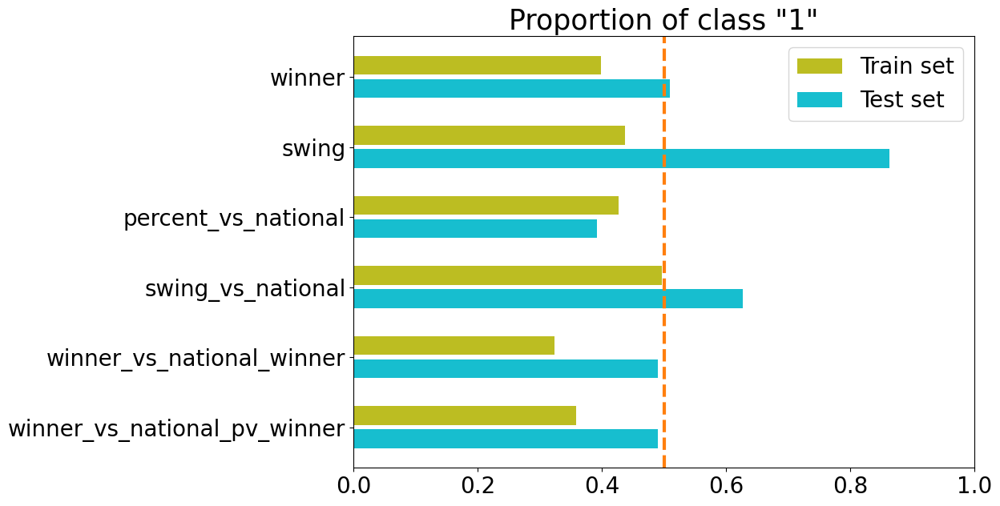

In [13]:
class1_counts=[]
for col in target_columns:
    class1_counts.append(y_train_df[col].value_counts(normalize=True).loc[1])
    class1_counts.append(y_test_df[col].value_counts(normalize=True).loc[1])

fig, ax = plt.subplots(figsize=(10,7))
y_ticks=np.arange(0.5,17,3)
y_pos=np.setdiff1d(np.arange(17),np.arange(2,17,3))

plt.axvline(x=0.5, color='tab:orange', linestyle='--', linewidth=3)

ax.barh(y=y_pos, width=np.flip(class1_counts), 
        color=np.tile(['tab:cyan','tab:olive'],6))
ax.set_yticks(y_ticks, labels=np.flip(target_columns));
ax.tick_params(axis='both', labelsize=20);

legend_elements=[Patch(facecolor='tab:olive',label='Train set'), 
                 Patch(facecolor='tab:cyan',label='Test set')]
ax.legend(handles=legend_elements, loc='upper right',fontsize=20);

ax.set_xlim(left=0, right=1)
ax.set_title('Proportion of class "1"', fontsize=25);
fig.savefig('proportion_of_class_1.png',dpi=400, bbox_inches="tight");

sample weights based on year

In [14]:
def get_sample_weight(year):
    return 5+(year-1976)/4

In [15]:
sample_weights=X_train_with_year.year.apply(get_sample_weight)
sample_weights

0       6.0
1       6.0
2       6.0
3       6.0
4       6.0
       ... 
505    15.0
506    15.0
507    15.0
508    15.0
509    15.0
Name: year, Length: 510, dtype: float64

In [16]:
X_train=X_train_with_year.drop(columns='year')

stratified shuffle split for use in logistic regression, SVM and Boosting cross validations

In [17]:
strat_shuf_split = StratifiedShuffleSplit(n_splits=5, 
                                          test_size=0.3, 
                                          random_state=rs)

## LOGISTIC REGRESSION

Logistic Regression models.

First, a grid search for all targets and top 10 hyperparameter combos for each target.
Then, some models for each target.

I advise you not to run the grid search cell, it could take a while.
Just run the max_iter cell in order to reproduce some models.

#### grid search for best hyperparameters

In [27]:
tol=0.1

In [18]:
max_iter=100000

In [45]:
all_cv_results = list()
for tgt in y_train_df.columns:
    print(tgt)
    l1_ratios=[0.0, 0.2, 0.4, 0.5, 0.6, 0.8, 1.0]
    Cs= [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]
    cv_results=pd.DataFrame()
    cv_results['l1_ratios']=l1_ratios
    cv_results['Cs']=np.tile(Cs,(len(l1_ratios),1)).tolist()
    cv_results=cv_results.explode(column='Cs').sort_values(by=['l1_ratios','Cs']).reset_index(drop=True)
    cv_results['F_one']=np.zeros(cv_results.shape[0],)
    cv_results['ROC_AUC']=np.zeros(cv_results.shape[0],)
    
    for index, (l1_ratio, C, _, _) in cv_results.iterrows():
        if (int(index)%10==0):
            print(str(index)+' '+str(l1_ratio)+' '+str(C))
        f1_scores=[]
        roc_auc_scores=[]
        for i, (tr_ind, te_id) in enumerate(strat_shuf_split.split(X_train, y_train_df[tgt])):
            X_train_cv = X_train.loc[tr_ind, :]
            y_train_cv = y_train_df.loc[tr_ind, tgt]
            sample_weights_train_cv=sample_weights.loc[tr_ind]
            
            X_valid_cv = X_train.loc[te_id, :]
            y_valid_cv = y_train_df.loc[te_id, tgt]
            sample_weights_valid_cv=sample_weights.loc[te_id]
            
            lr_model = LogisticRegression(random_state=rs,max_iter=max_iter,
                                          tol=tol,
                                          solver='saga',penalty='elasticnet', 
                                          l1_ratio=l1_ratio, C=C)
            lr_model.fit(X_train_cv, y_train_cv,sample_weight=sample_weights_train_cv)
            pred=lr_model.predict(X_valid_cv)
            pred_proba=lr_model.predict_proba(X_valid_cv)
            f1_scores.append(f1_score(y_true=y_valid_cv,y_pred=pred, sample_weight=sample_weights_valid_cv))
            roc_auc_scores.append(roc_auc_score(y_true=y_valid_cv,y_score=pred_proba[:,1], sample_weight=sample_weights_valid_cv))
        
        cv_results.iloc[index,2]=np.mean(f1_scores)
        cv_results.iloc[index,3]=np.mean(roc_auc_scores)
    
    top_res_label = pd.MultiIndex(levels=[[tgt], cv_results.columns.tolist()], 
                            codes=[[0,0,0,0], [0,1,2,3]])
    all_cv_results.append(pd.DataFrame(cv_results.sort_values(by='F_one',ascending=False).head(10).to_numpy(), columns=top_res_label))
    print('----------------------')
    
    


winner
0 0.0 0.0001
10 0.2 0.01
20 0.4 1.0
30 0.5 100.0
40 0.8 0.0001
50 1.0 0.01
----------------------
swing
0 0.0 0.0001
10 0.2 0.01
20 0.4 1.0
30 0.5 100.0
40 0.8 0.0001
50 1.0 0.01
----------------------
percent_vs_national
0 0.0 0.0001
10 0.2 0.01
20 0.4 1.0
30 0.5 100.0
40 0.8 0.0001
50 1.0 0.01
----------------------
swing_vs_national
0 0.0 0.0001
10 0.2 0.01
20 0.4 1.0
30 0.5 100.0
40 0.8 0.0001
50 1.0 0.01
----------------------
winner_vs_national_winner
0 0.0 0.0001
10 0.2 0.01
20 0.4 1.0
30 0.5 100.0
40 0.8 0.0001
50 1.0 0.01
----------------------
winner_vs_national_pv_winner
0 0.0 0.0001
10 0.2 0.01
20 0.4 1.0
30 0.5 100.0
40 0.8 0.0001
50 1.0 0.01
----------------------


In [46]:
all_cv_results

[     winner                          
   l1_ratios    Cs     F_one   ROC_AUC
 0       0.6   0.1  0.823252  0.921481
 1       0.4   0.1  0.822266  0.921569
 2       0.0  0.01  0.820762  0.918655
 3       0.5   0.1  0.820347  0.921543
 4       0.8   1.0  0.819057  0.922436
 5       0.4   1.0  0.819057  0.922706
 6       0.6   1.0  0.819057  0.922457
 7       0.2   1.0  0.819057  0.922644
 8       0.5   1.0  0.819057  0.922567
 9       1.0   1.0  0.819057  0.922508,
       swing                          
   l1_ratios    Cs     F_one   ROC_AUC
 0       1.0  0.01  0.794124  0.871845
 1       0.5  0.01  0.790697  0.878231
 2       0.8  0.01  0.787696  0.872499
 3       0.6  0.01  0.785889  0.874141
 4       0.2  0.01  0.783824   0.86355
 5       0.0  0.01  0.783176  0.867569
 6       0.4  0.01  0.778506  0.871124
 7       0.5   0.1  0.774565  0.864722
 8       0.4   0.1  0.774225  0.864771
 9       1.0   0.1  0.769638  0.865112,
   percent_vs_national                           
            

#### winner

In [40]:
target='winner'

One (lucky) good result

In [41]:
lr_model = LogisticRegression(random_state=rs,max_iter=max_iter,solver='saga', penalty='elasticnet',C=0.01, l1_ratio=0.8)
lr_model.fit(X_train, y_train_df[target],sample_weight=sample_weights)

pred=lr_model.predict(X_train)
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

0.8116808461715337

In [42]:
pred_test=lr_model.predict(X_test)
f1_score(y_true=y_test_df[target],y_pred=pred_test)

0.8799999999999999

In [43]:
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

45.0

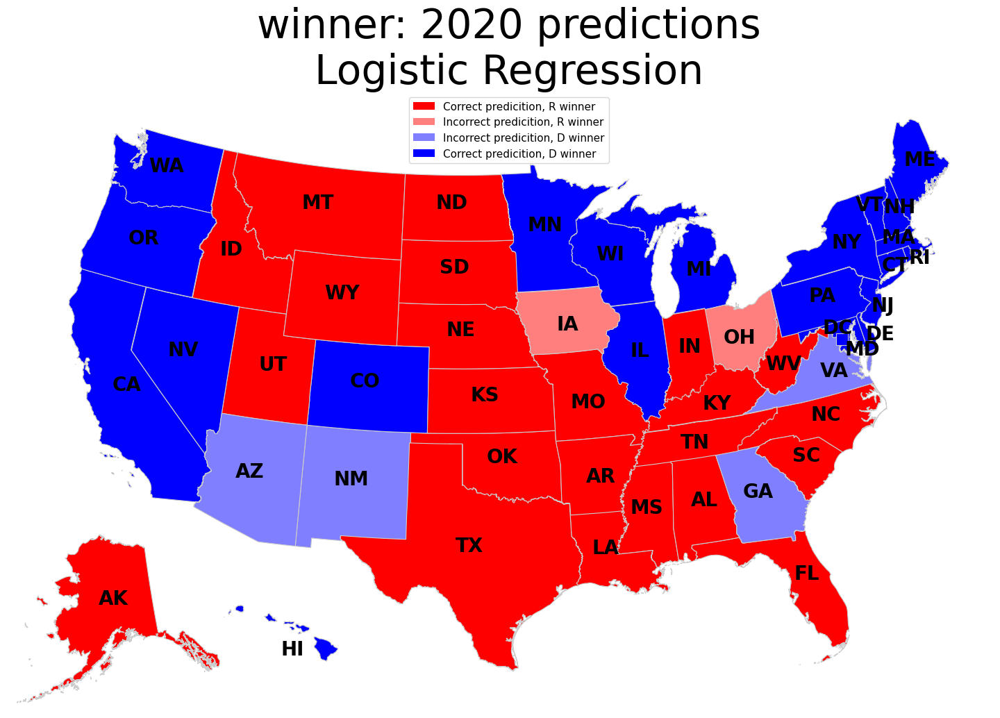

In [44]:
show_result(target_name=target, y_pred=pred_test, model_name='Logistic Regression')

and that's how most models with 'best' CV hyperparams perform 

In [45]:
lr_model = LogisticRegression(random_state=rs,max_iter=max_iter,solver='saga', penalty='elasticnet',C=1.0, l1_ratio=0.4)
lr_model.fit(X_train, y_train_df[target],sample_weight=sample_weights)

pred=lr_model.predict(X_train)
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

0.9869451697127937

In [46]:
pred_test=lr_model.predict(X_test)
f1_score(y_true=y_test_df[target],y_pred=pred_test)

0.6956521739130436

In [47]:
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

30.0

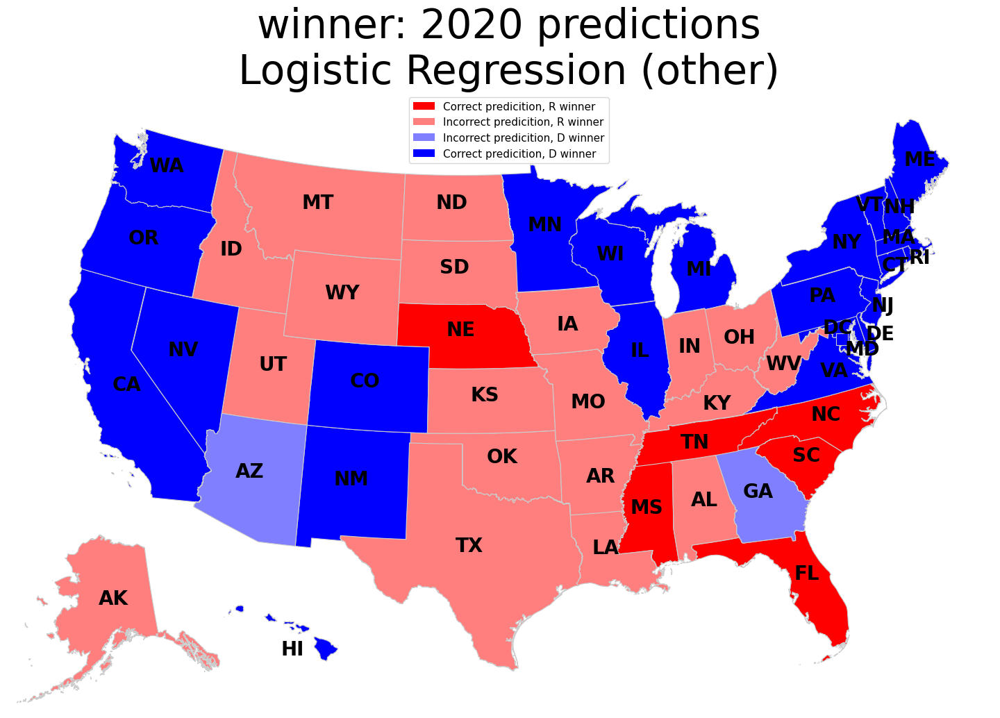

In [48]:
show_result(target_name=target, y_pred=pred_test, model_name='Logistic Regression (other)')

#### swing

In [109]:
target='swing'

almost all the models predict all 1s 

In [110]:
lr_model = LogisticRegression(random_state=rs,
                                          solver='saga',penalty='elasticnet', 
                                          l1_ratio=1.0, C=0.01)
lr_model.fit(X_train, y_train_df[target],sample_weight=sample_weights)
pred=lr_model.predict(X_train)

In [111]:
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

0.8056195301704283

In [112]:
pred_test=lr_model.predict(X_test)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

44.0

In [113]:
balanced_accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

0.5

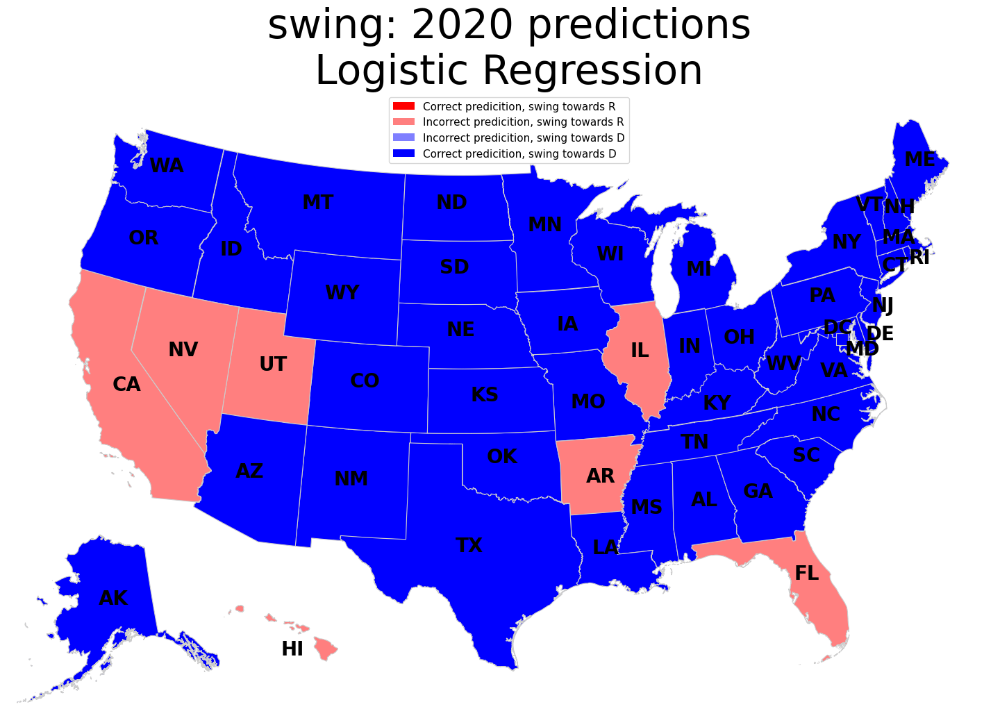

In [114]:
show_result(target_name=target, y_pred=pred_test, model_name='Logistic Regression')

#### percent_vs_national

In [49]:
target='percent_vs_national'

one (lucky) good result

In [89]:
lr_model = LogisticRegression(random_state=rs,max_iter=max_iter,solver='saga',penalty='elasticnet', 
                              C=0.01, l1_ratio=0.2)
lr_model.fit(X_train, y_train_df[target],sample_weight=sample_weights)

pred=lr_model.predict(X_train)

In [90]:
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

0.8510541827250057

In [91]:
pred_test=lr_model.predict(X_test)
f1_score(y_true=y_test_df[target],y_pred=pred_test)

0.8205128205128205

In [92]:
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

44.0

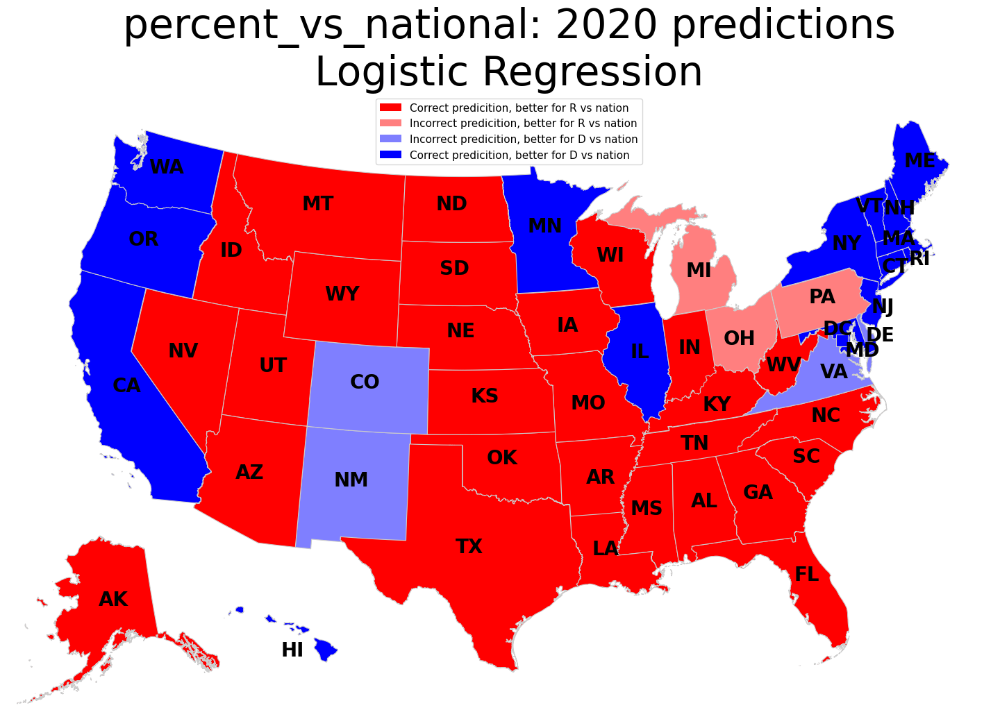

In [93]:
show_result(target_name=target, y_pred=pred_test, model_name='Logistic Regression')

others aren't so good and there's no way to tell from cross validation

In [94]:
lr_model = LogisticRegression(random_state=rs,max_iter=max_iter,solver='saga',penalty='elasticnet', 
                              C=0.1, l1_ratio=0.8)
lr_model.fit(X_train, y_train_df[target],sample_weight=sample_weights)
pred=lr_model.predict(X_train)
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

0.914786418400876

In [95]:
pred_test=lr_model.predict(X_test)
f1_score(y_true=y_test_df[target],y_pred=pred_test)

0.625

In [96]:
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

27.0

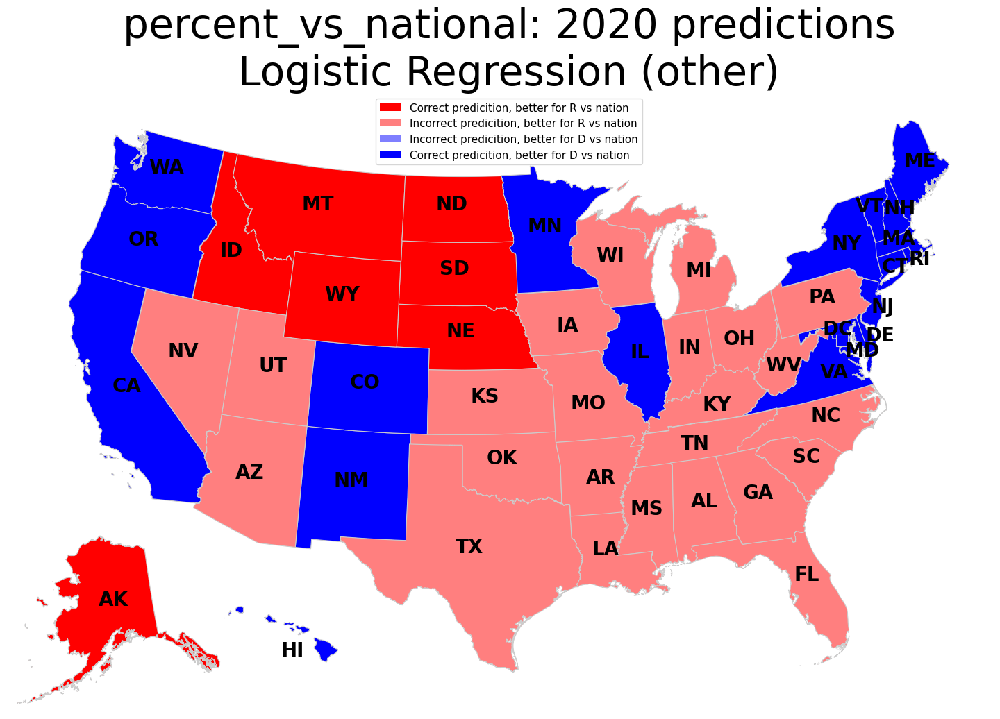

In [97]:
show_result(target_name=target, y_pred=pred_test, model_name='Logistic Regression (other)')

#### swing_vs_national

no useful models

In [101]:
target='swing_vs_national'

In [125]:
lr_model = LogisticRegression(random_state=rs,
                                          solver='saga',penalty='elasticnet', 
                                          l1_ratio=0.4, C=10)
lr_model.fit(X_train, y_train_df[target],sample_weight=sample_weights)
pred=lr_model.predict(X_train)

In [126]:
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

0.7727195225916453

In [127]:
pred_test=lr_model.predict(X_test)
f1_score(y_true=y_test_df[target],y_pred=pred_test)

0.7710843373493976

In [128]:
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

32.0

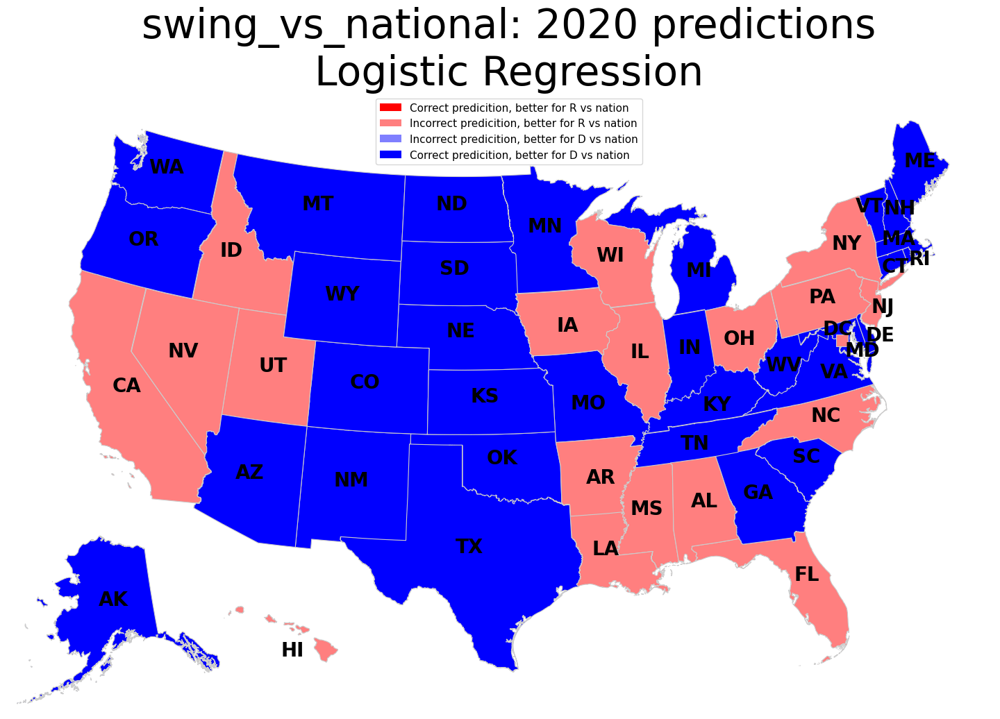

In [129]:
show_result(target_name=target, y_pred=pred_test, model_name='Logistic Regression')

#### winner_vs_national_winner

no useful models

In [130]:
target='winner_vs_national_winner'

In [131]:
lr_model = LogisticRegression(random_state=rs,
                                          solver='saga',penalty='elasticnet', 
                                          l1_ratio=1.0, C=1)
lr_model.fit(X_train, y_train_df[target],sample_weight=sample_weights)
pred=lr_model.predict(X_train)

In [132]:
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

0.6725775807473086

In [133]:
pred_test=lr_model.predict(X_test)
f1_score(y_true=y_test_df[target],y_pred=pred_test)

0.0

In [134]:
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

26.0

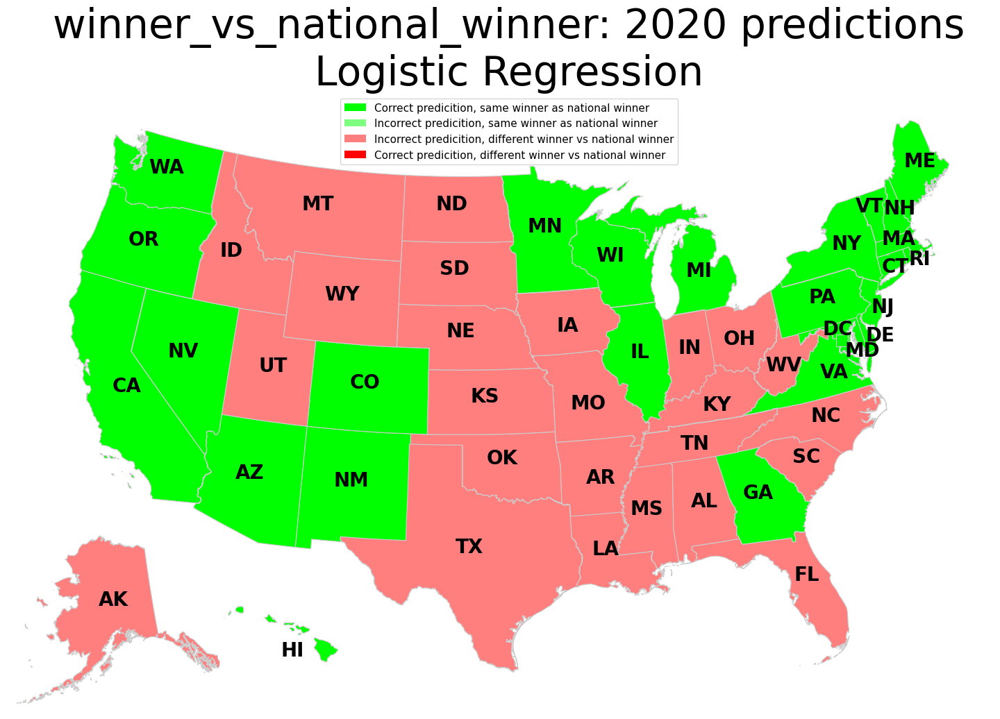

In [138]:
show_result(target_name=target, y_pred=pred_test, model_name='Logistic Regression')

#### winner_vs_national_pv_winner

In [139]:
target='winner_vs_national_pv_winner'

no useful models

In [150]:
lr_model = LogisticRegression(random_state=rs,
                                          solver='saga',penalty='elasticnet', 
                                          l1_ratio=0.0, C=0.01)
lr_model.fit(X_train, y_train_df[target],sample_weight=sample_weights)
pred=lr_model.predict(X_train)

In [151]:
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

0.745790895863646

In [152]:
pred_test=lr_model.predict(X_test)
f1_score(y_true=y_test_df[target],y_pred=pred_test)

0.6666666666666666

In [154]:
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

26.0

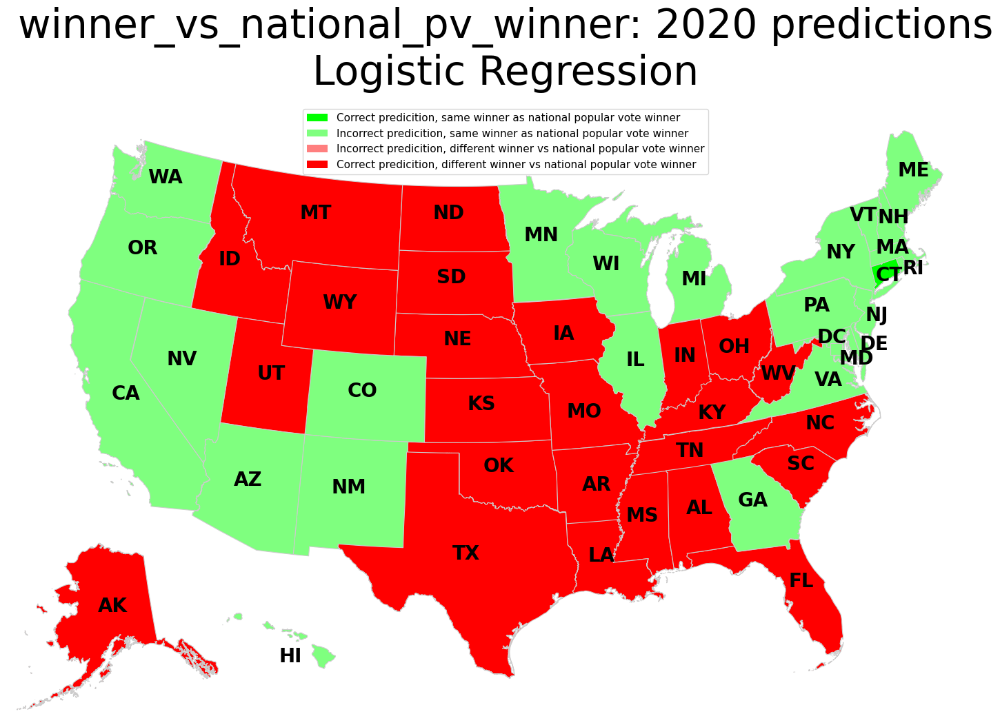

In [153]:
show_result(target_name=target, y_pred=pred_test, model_name='Logistic Regression')

## SVM

Support vector machine models.

First, scaling the dataset.

In [99]:
scaler=StandardScaler()
scaler.fit(X_train, sample_weight=sample_weights)
X_train_scaled=pd.DataFrame(scaler.transform(X_train))
X_train_scaled.columns=scaler.get_feature_names_out()
X_test_scaled=pd.DataFrame(scaler.transform(X_test))
X_test_scaled.columns=scaler.get_feature_names_out()

Just as with Logistic Regression, a grid search for all targets and top 10 hyperparameter combos for each target. Then, some models for each target.

I advise you not to run the grid search cell, it could take a while. 

#### SVM grid search

In [73]:
tol=0.0001

In [81]:
all_svm_cv_results = list()
for tgt in y_train_df.columns:
    print(tgt)
    kernels=['poly', 'rbf', 'sigmoid']
    Cs= [0.01, 0.1, 1, 10, 100, 150, 200, 1000]
    degrees= [1, 2, 3, 4, 5, 6, 8, 10]
    svm_cv_results=pd.DataFrame()
    svm_cv_results['kernel']=kernels
    svm_cv_results['C']=np.tile(Cs,(len(kernels),1)).tolist()
    svm_cv_results=svm_cv_results.explode(column='C').sort_values(by=['kernel','C']).reset_index(drop=True)
    svm_cv_results['degree']=pd.concat([pd.Series(np.tile(degrees,(len(Cs),1)).tolist()), 
                                        pd.Series(np.zeros(len(Cs)*(len(kernels)-1),dtype=int))], 
                                       ignore_index=True)
    svm_cv_results=svm_cv_results.explode(column='degree').sort_values(by=['kernel','C','degree']).reset_index(drop=True)
    svm_cv_results['F_one']=np.zeros(svm_cv_results.shape[0],)
    
    for index, (kernel, C, degree, _) in svm_cv_results.iterrows():
        if (int(index)%10==0):
            print(str(index)+' '+kernel+' '+str(C))
        f1_scores=[]
        
        for i, (tr_ind, te_id) in enumerate(strat_shuf_split.split(X_train, y_train_df[tgt])):
            X_train_cv = X_train.loc[tr_ind, :]
            y_train_cv = y_train_df.loc[tr_ind, tgt]
            sample_weights_train_cv=sample_weights.loc[tr_ind]
            
            X_valid_cv = X_train.loc[te_id, :]
            y_valid_cv = y_train_df.loc[te_id, tgt]
            sample_weights_valid_cv=sample_weights.loc[te_id]
            
            svm_model = SVC(random_state=rs,
                            tol=tol,
                            kernel=kernel,
                            degree=degree,
                            C=C)
            svm_model.fit(X_train_cv, y_train_cv.values.ravel(),sample_weight=sample_weights_train_cv)
            pred=svm_model.predict(X_valid_cv)
            f1_scores.append(f1_score(y_true=y_valid_cv,y_pred=pred, sample_weight=sample_weights_valid_cv))
        
        svm_cv_results.iloc[index,3]=np.mean(f1_scores)
    
    top_res_label = pd.MultiIndex(levels=[[tgt], svm_cv_results.columns.tolist()], 
                            codes=[[0,0,0,0], [0,1,2,3]])
    all_svm_cv_results.append(pd.DataFrame(svm_cv_results.sort_values(by='F_one',ascending=False).head(10).to_numpy(), columns=top_res_label))
    print('----------------------')
    
    


winner
0 poly 0.01
10 poly 0.1
20 poly 1.0
30 poly 10.0
40 poly 150.0
50 poly 200.0
60 poly 1000.0
70 rbf 200.0
----------------------
swing
0 poly 0.01
10 poly 0.1
20 poly 1.0
30 poly 10.0
40 poly 150.0
50 poly 200.0
60 poly 1000.0
70 rbf 200.0
----------------------
percent_vs_national
0 poly 0.01
10 poly 0.1
20 poly 1.0
30 poly 10.0
40 poly 150.0
50 poly 200.0
60 poly 1000.0
70 rbf 200.0
----------------------
swing_vs_national
0 poly 0.01
10 poly 0.1
20 poly 1.0
30 poly 10.0
40 poly 150.0
50 poly 200.0
60 poly 1000.0
70 rbf 200.0
----------------------
winner_vs_national_winner
0 poly 0.01
10 poly 0.1
20 poly 1.0
30 poly 10.0
40 poly 150.0
50 poly 200.0
60 poly 1000.0
70 rbf 200.0
----------------------
winner_vs_national_pv_winner
0 poly 0.01
10 poly 0.1
20 poly 1.0
30 poly 10.0
40 poly 150.0
50 poly 200.0
60 poly 1000.0
70 rbf 200.0
----------------------


In [82]:
all_svm_cv_results

[  winner                        
   kernel      C degree     F_one
 0   poly    0.1      4  0.846102
 1    rbf    1.0      0  0.846066
 2   poly    1.0      1  0.843966
 3   poly    1.0      2  0.839253
 4   poly    0.1      3  0.838288
 5   poly    0.1      5  0.836031
 6   poly    1.0      3    0.8259
 7    rbf   10.0      0  0.816624
 8   poly   10.0      1  0.816081
 9    rbf  100.0      0  0.814254,
    swing                       
   kernel     C degree     F_one
 0    rbf   0.1      0  0.787071
 1    rbf   1.0      0  0.781699
 2   poly   0.1      2   0.77956
 3   poly   1.0      1  0.779441
 4   poly  0.01      4  0.775147
 5   poly   0.1      4   0.77492
 6   poly  0.01      6  0.772271
 7   poly  0.01      5  0.771166
 8   poly  0.01      8   0.77089
 9   poly   0.1      3  0.766979,
   percent_vs_national                       
                kernel     C degree     F_one
 0                poly   1.0      3  0.845498
 1                poly   1.0      2  0.845049
 2        

#### winner

In [582]:
target='winner'

this is the best result. it does poorly with most other hyperparam values, even those with higher CV scores

In [161]:
svm_model = SVC(random_state=rs, C=1.0, kernel='poly',degree=5)
svm_model.fit(X_train_scaled, y_train_df[target].values.ravel(),sample_weight=sample_weights)

pred=svm_model.predict(X_train_scaled)
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

0.9910146833223756

In [162]:
pred_test=svm_model.predict(X_test_scaled)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

33.0

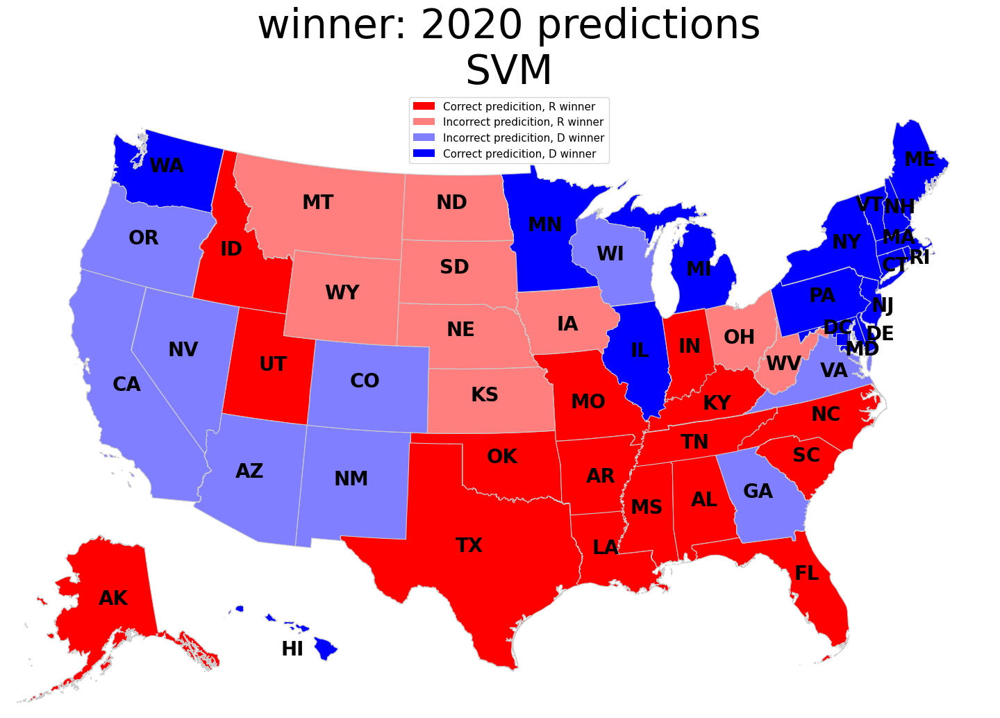

In [163]:
show_result(target_name=target, y_pred=pred_test, model_name='SVM')

all models with RBF kernel predict only 1 class, even if the CV score was high

In [589]:
svm_model = SVC(random_state=rs, C=1.0, kernel='rbf')
svm_model.fit(X_train_scaled, y_train_df[target].values.ravel(),sample_weight=sample_weights)

pred=svm_model.predict(X_train_scaled)
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

1.0

In [590]:
pred_test=svm_model.predict(X_test_scaled)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

25.0

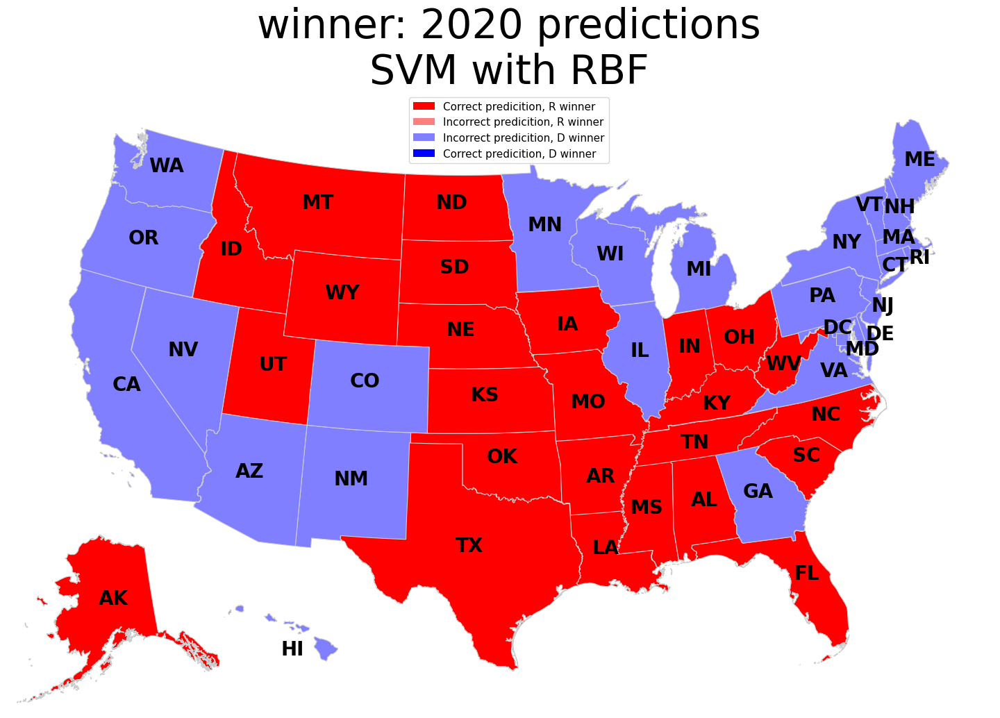

In [591]:
show_result(target_name=target, y_pred=pred_test, model_name='SVM with RBF')

#### swing

In [100]:
target='swing'

this lucky result is ironically the best for swing in the entire project

In [101]:
svm_model = SVC(random_state=rs, C=0.01, kernel='poly',degree=6)
svm_model.fit(X_train_scaled, y_train_df[target].values.ravel(),sample_weight=sample_weights)

pred=svm_model.predict(X_train_scaled)
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

0.22774168895682081

In [102]:
pred_test=svm_model.predict(X_test_scaled)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

37.0

In [103]:
balanced_accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

0.6006493506493507

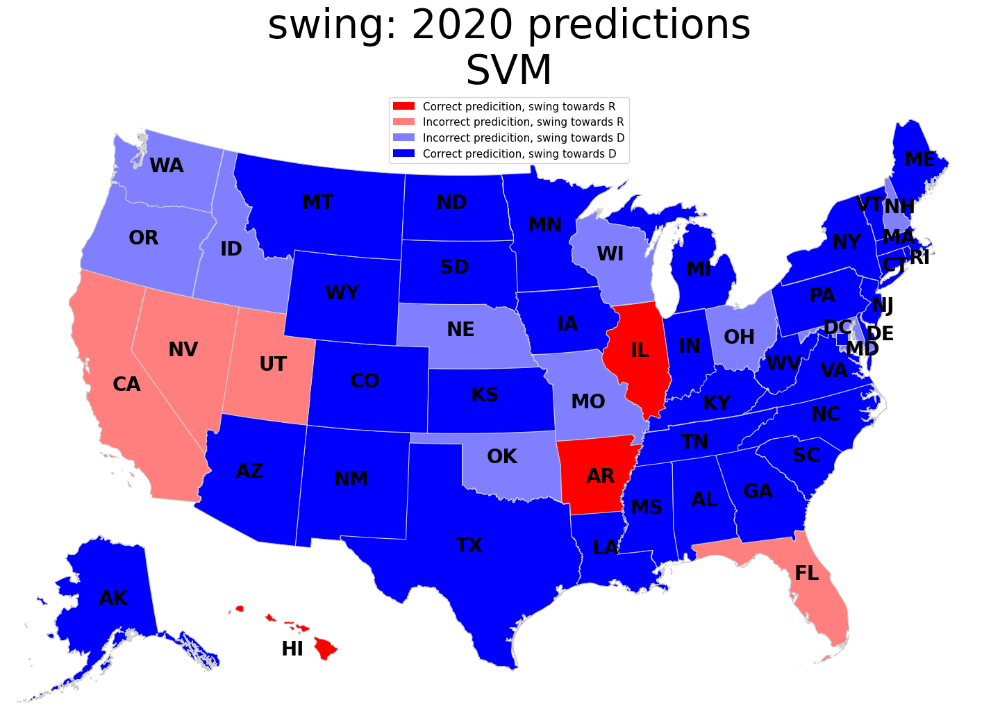

In [104]:
show_result(target_name=target, y_pred=pred_test, model_name='SVM')

In [105]:
svm_model = SVC(random_state=rs, C=0.1, kernel='rbf')
svm_model.fit(X_train_scaled, y_train_df[target].values.ravel(),sample_weight=sample_weights)

pred=svm_model.predict(X_train_scaled)
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

0.9168366190799909

In [106]:
pred_test=svm_model.predict(X_test_scaled)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

44.0

In [107]:
balanced_accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

0.5

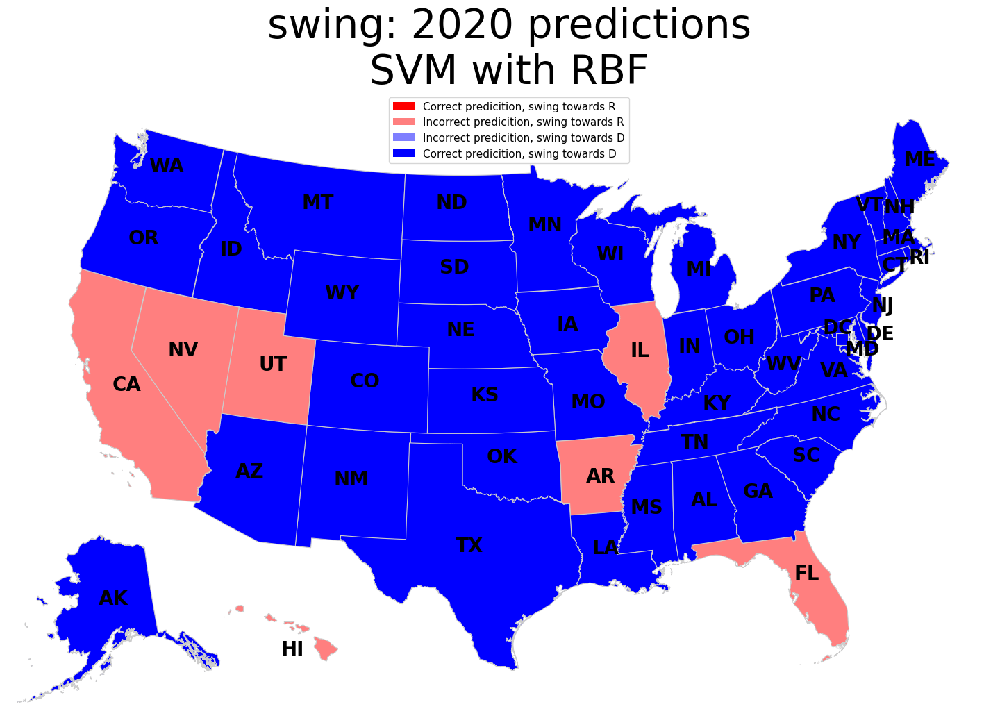

In [108]:
show_result(target_name=target, y_pred=pred_test, model_name='SVM with RBF')

#### percent_vs_national

In [177]:
target='percent_vs_national'

again, one lucky result with poly, nothing with RBF

In [178]:
svm_model = SVC(random_state=rs, C=0.1, kernel='poly',degree=3)
svm_model.fit(X_train_scaled, y_train_df[target].values.ravel(),sample_weight=sample_weights)

pred=svm_model.predict(X_train_scaled)
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

0.7677801724137931

In [179]:
pred_test=svm_model.predict(X_test_scaled)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

35.0

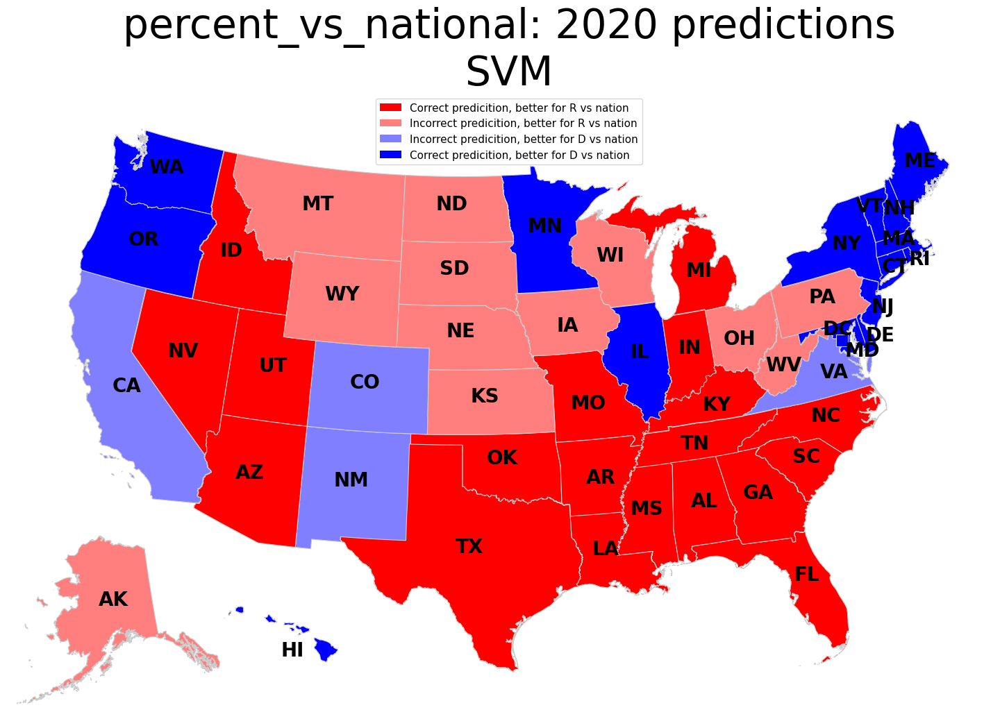

In [180]:
show_result(target_name=target, y_pred=pred_test, model_name='SVM')

In [181]:
svm_model = SVC(random_state=rs, C=1.0, kernel='rbf')
svm_model.fit(X_train_scaled, y_train_df[target].values.ravel(),sample_weight=sample_weights)

pred=svm_model.predict(X_train_scaled)
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

1.0

In [182]:
pred_test=svm_model.predict(X_test_scaled)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

30.999999999999996

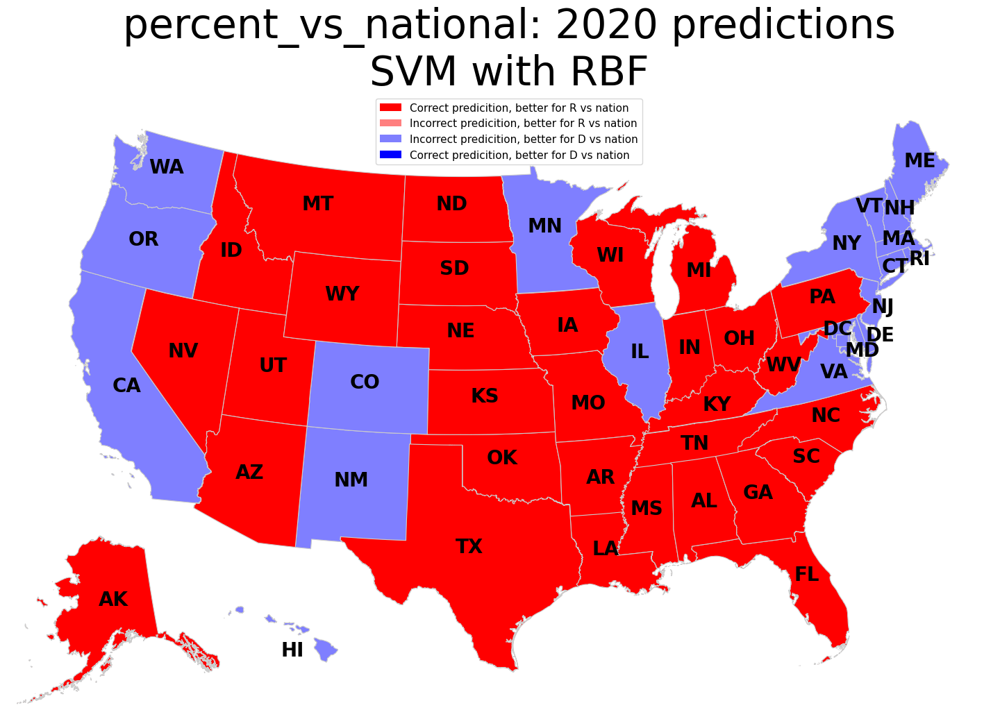

In [183]:
show_result(target_name=target, y_pred=pred_test, model_name='SVM with RBF')

#### swing_vs_national

In [28]:
target='swing_vs_national'

no useful models here

In [32]:
svm_model = SVC(random_state=rs, C=1.0, kernel='poly',degree=1)
svm_model.fit(X_train_scaled, y_train_df[target].values.ravel(),sample_weight=sample_weights)

pred=svm_model.predict(X_train_scaled)
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

0.8153550863723609

In [33]:
pred_test=svm_model.predict(X_test_scaled)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

24.0

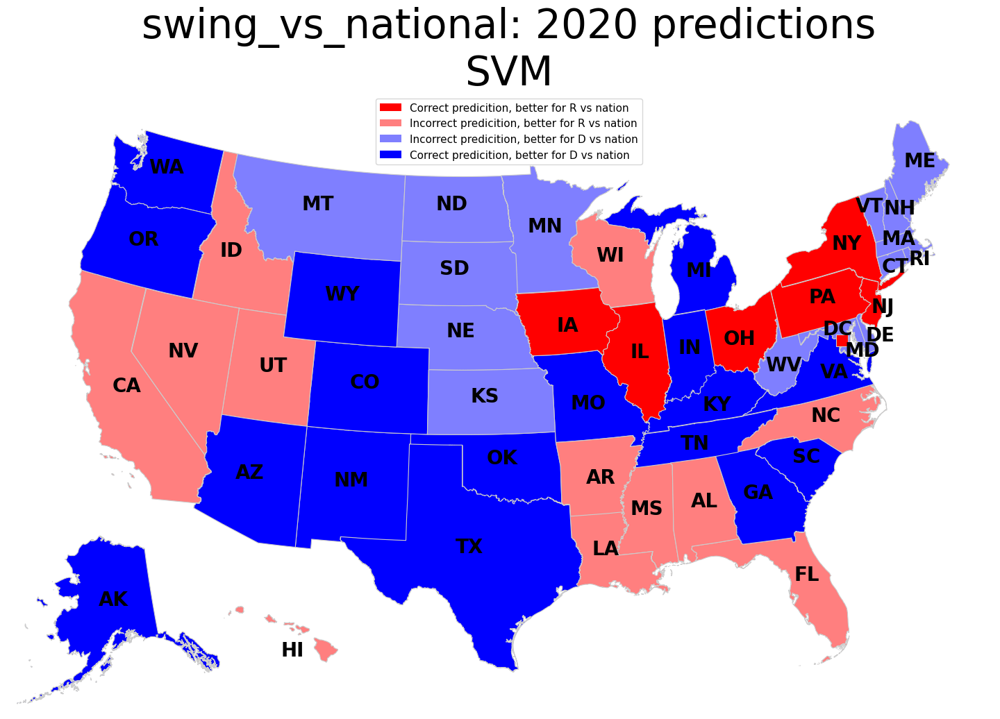

In [34]:
show_result(target_name=target, y_pred=pred_test, model_name='SVM')

In [380]:
svm_model = SVC(random_state=rs, C=1.0, kernel='rbf')
svm_model.fit(X_train_scaled, y_train_df[target].values.ravel(),sample_weight=sample_weights)

pred=svm_model.predict(X_train_scaled)
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

1.0

In [381]:
pred_test=svm_model.predict(X_test_scaled)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

32.0

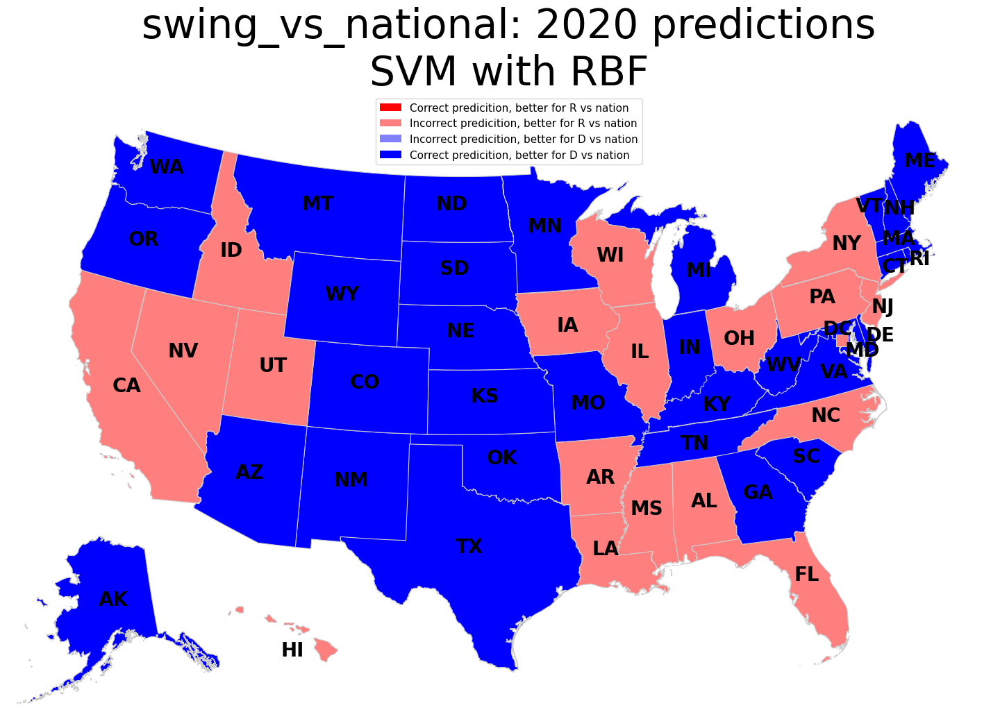

In [382]:
show_result(target_name=target, y_pred=pred_test, model_name='SVM with RBF')

#### winner_vs_national_winner

In [415]:
target='winner_vs_national_winner'

no useful models here

In [431]:
svm_model = SVC(random_state=rs, C=10, kernel='rbf')
svm_model.fit(X_train_scaled, y_train_df[target].values.ravel(),sample_weight=sample_weights)

pred=svm_model.predict(X_train_scaled)
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

1.0

In [432]:
pred_test=svm_model.predict(X_test_scaled)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

26.0

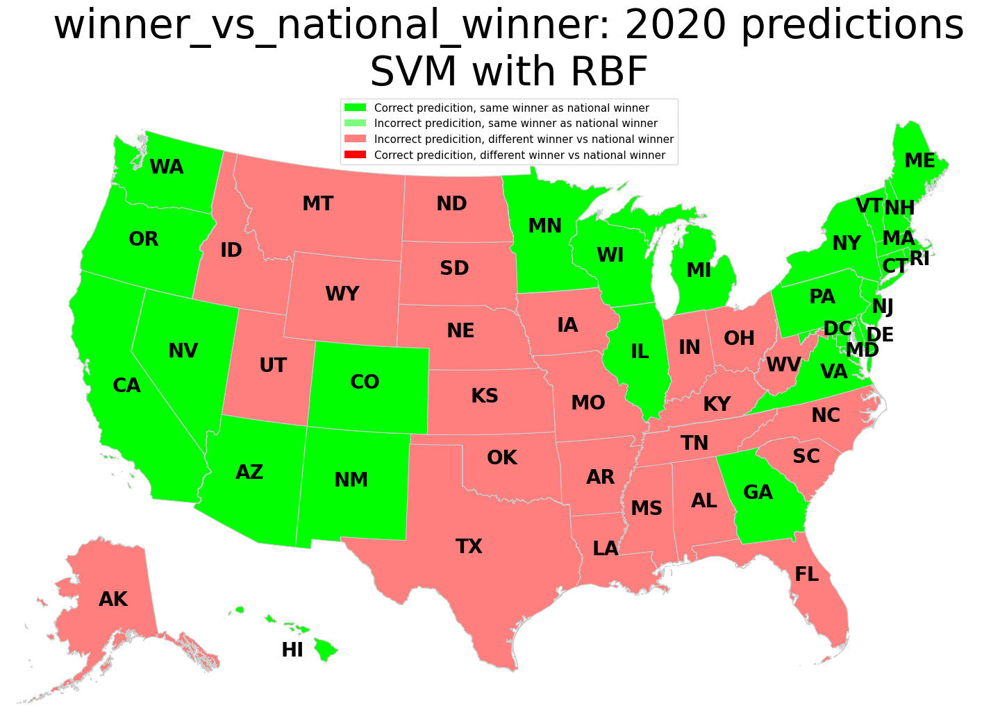

In [433]:
show_result(target_name=target, y_pred=pred_test, model_name='SVM with RBF')

In [416]:
svm_model = SVC(random_state=rs, C=0.01, kernel='poly',degree=8)
svm_model.fit(X_train_scaled, y_train_df[target].values.ravel(),sample_weight=sample_weights)

pred=svm_model.predict(X_train_scaled)
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

0.255611543747137

In [417]:
pred_test=svm_model.predict(X_test_scaled)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

28.000000000000004

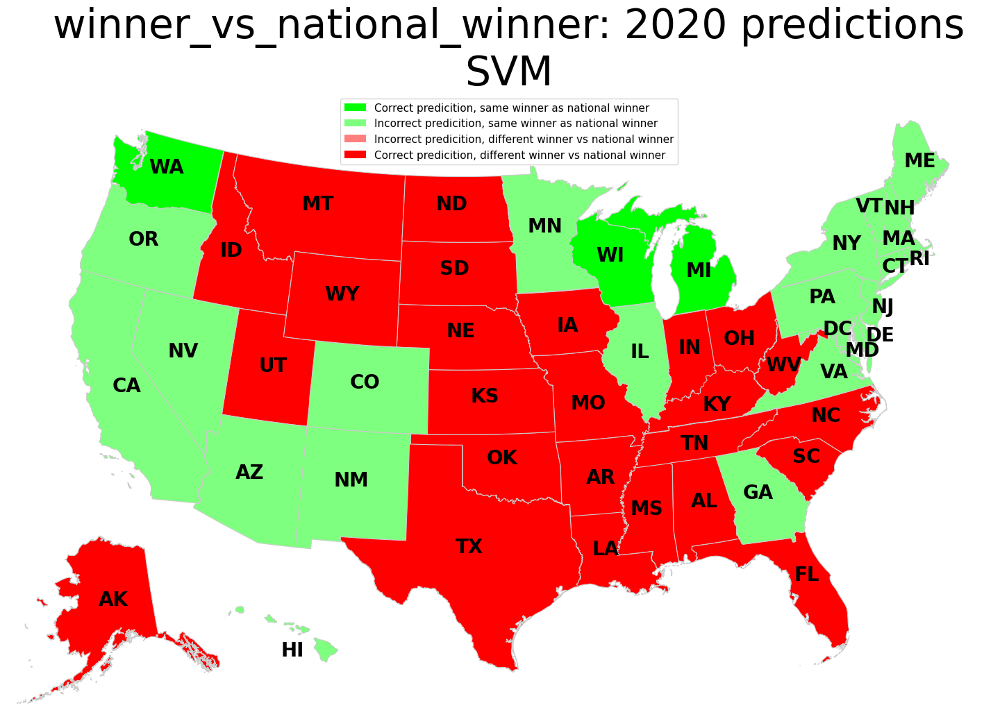

In [418]:
show_result(target_name=target, y_pred=pred_test, model_name='SVM')

#### winner_vs_national_pv_winner

In [471]:
target='winner_vs_national_pv_winner'

no useful models here

In [472]:
svm_model = SVC(random_state=rs, C=10, kernel='rbf')
svm_model.fit(X_train_scaled, y_train_df[target].values.ravel(),sample_weight=sample_weights)

pred=svm_model.predict(X_train_scaled)
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

1.0

In [473]:
pred_test=svm_model.predict(X_test_scaled)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

26.0

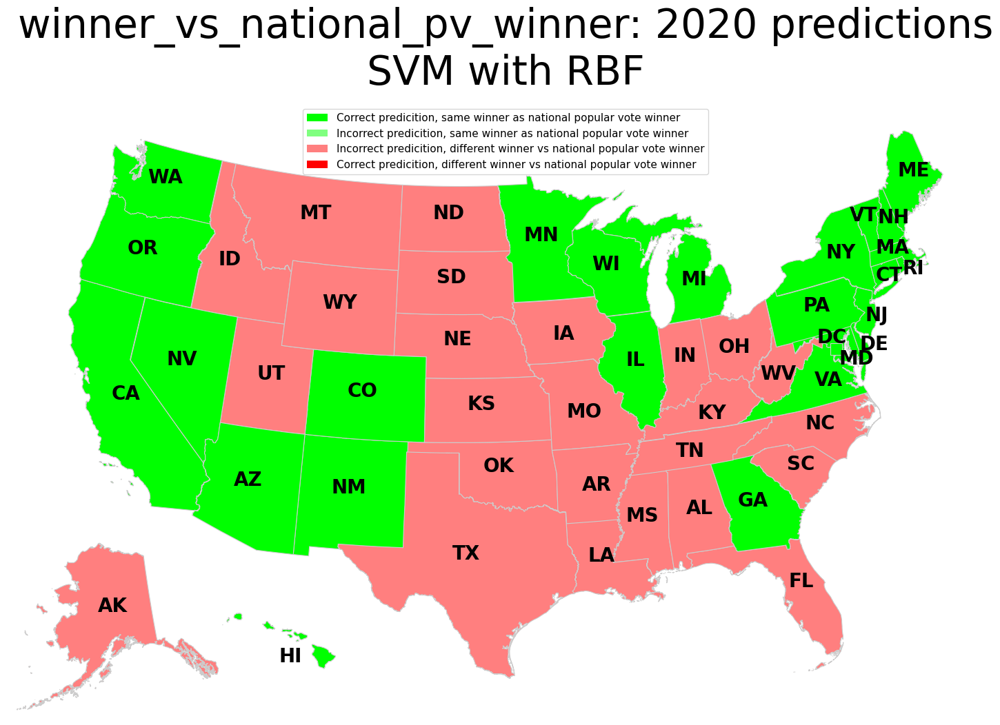

In [474]:
show_result(target_name=target, y_pred=pred_test, model_name='SVM with RBF')

In [480]:
svm_model = SVC(random_state=rs, C=0.1, kernel='poly',degree=4)
svm_model.fit(X_train_scaled, y_train_df[target].values.ravel(),sample_weight=sample_weights)

pred=svm_model.predict(X_train_scaled)
f1_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

0.5147620701632512

In [481]:
pred_test=svm_model.predict(X_test_scaled)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

26.0

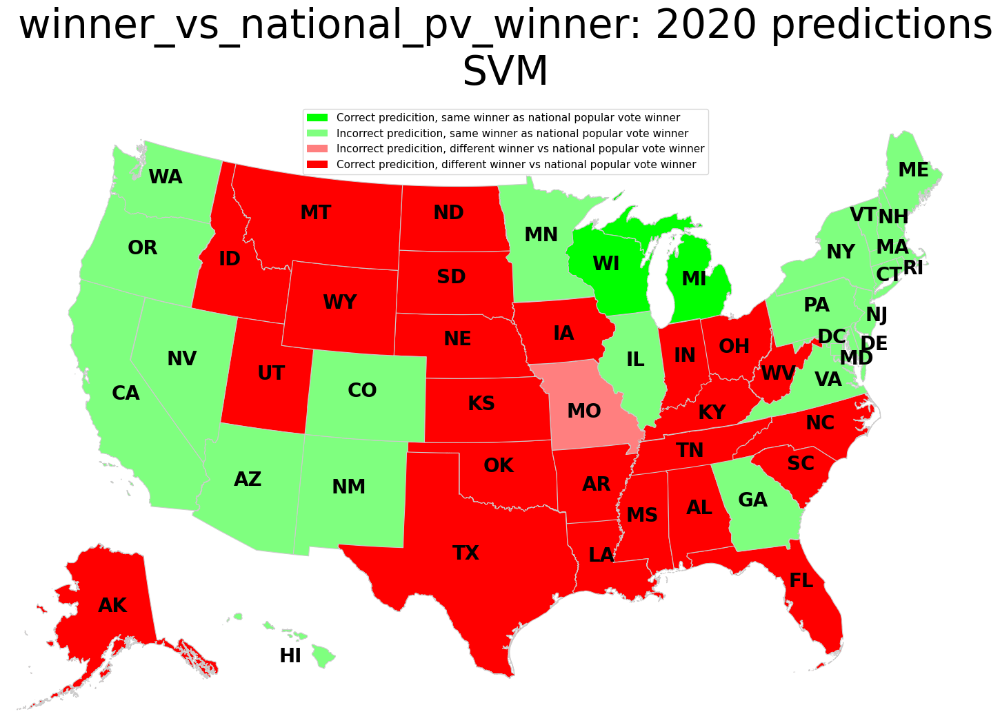

In [482]:
show_result(target_name=target, y_pred=pred_test, model_name='SVM')

## RANDOM FOREST

Random Forest models.


First, a seacrch for the best number of trees for each target. Since random Forests rarely overfit, only number of trees was searched through here. 

These two cells could run for a few minutes

In [141]:
n_trees_list=[15, 20, 30, 40, 50, 100, 150, 200, 300, 400, 700, 1000]
ranfor_oob_df=pd.DataFrame()
ranfor_oob_df['n_trees']=n_trees_list
ranfor_oob_df.set_index('n_trees', inplace=True)
for tgt in target_columns:
    oob_list=[]
    RF = RandomForestClassifier(oob_score=True, 
                            random_state=rs, 
                            warm_start=True,
                            n_jobs=-1)
    for n_trees in n_trees_list:
        RF.set_params(n_estimators=n_trees)
        RF.fit(X_train.values, y_train_df[tgt].values)
        oob_list.append(1 - RF.oob_score_)
    ranfor_oob_df[tgt]=oob_list

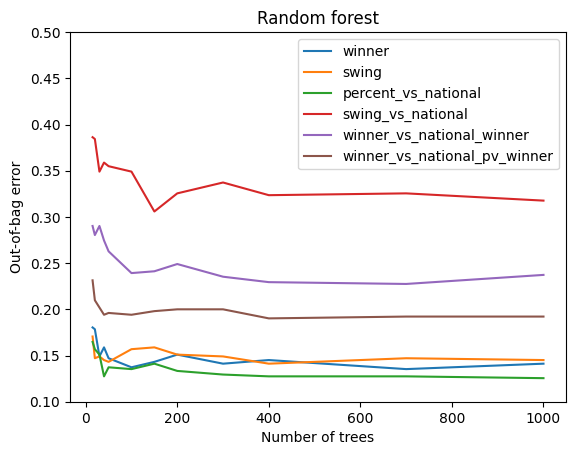

In [142]:
fig, ax = plt.subplots()
ranfor_oob_df.plot(ylabel='Out-of-bag error', xlabel='Number of trees', title='Random forest', ylim=[0.1, 0.5], ax=ax);
fig.savefig('random_forest_oob_error.png',dpi=400, bbox_inches="tight");

#### winner

In [42]:
target='winner'

good Random Forest result. also, it's stable

In [43]:
RFC = RandomForestClassifier( n_estimators=300, random_state=rs, oob_score=True, n_jobs=-1)
RFC.fit(X_train.values, y_train_df[target].values)
RFC.oob_score_

0.8588235294117647

In [44]:
pred_test = RFC.predict(X_test)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

47.0

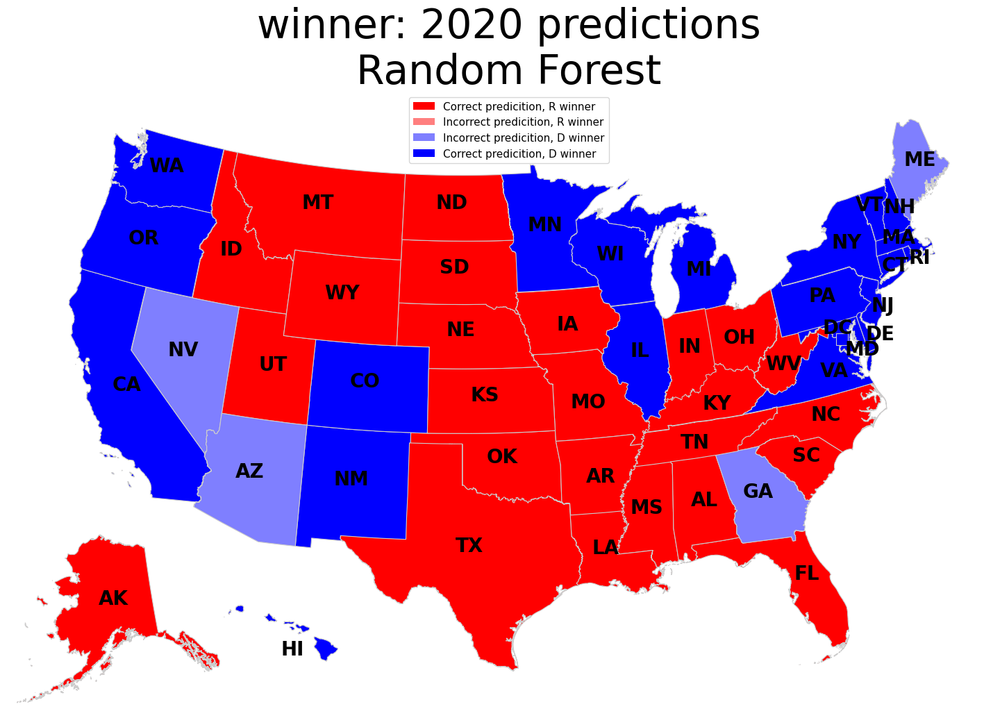

In [45]:
show_result(target_name=target, y_pred=pred_test, model_name='Random Forest')

#### swing

In [115]:
target='swing'

according to adjusted accuracy, this is barely better than guessing 

In [116]:
RFC = RandomForestClassifier( n_estimators=400, random_state=rs, oob_score=True, n_jobs=-1)
RFC.fit(X_train.values, y_train_df[target].values)
RFC.oob_score_

0.8588235294117647

In [117]:
pred_test = RFC.predict(X_test)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

42.0

In [118]:
balanced_accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

0.5373376623376623

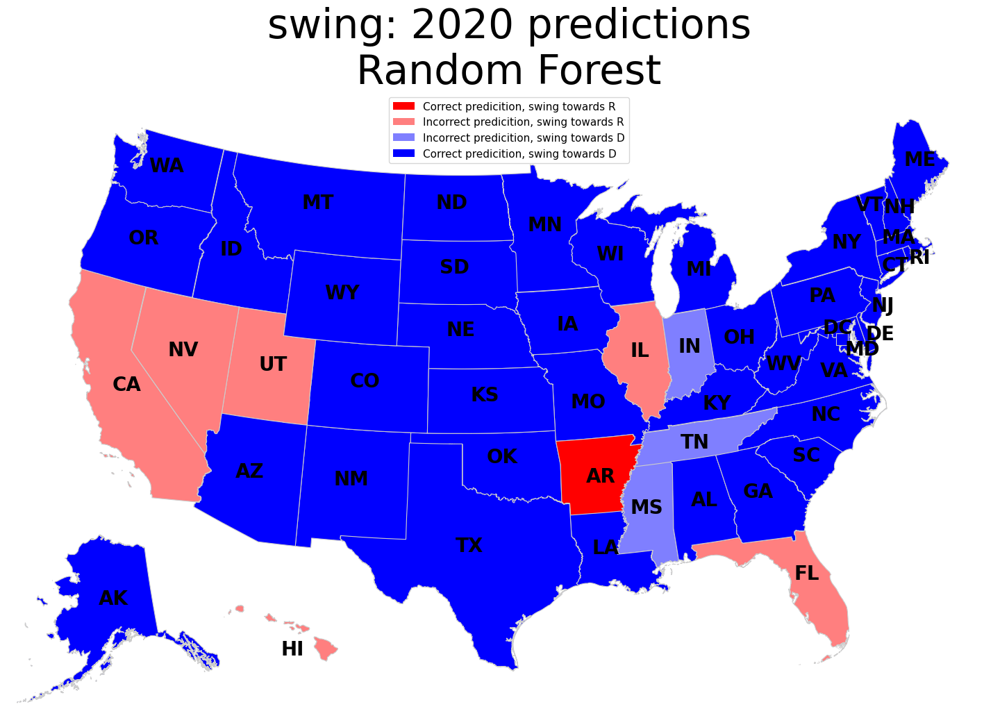

In [119]:
show_result(target_name=target, y_pred=pred_test, model_name='Random Forest')

#### percent_vs_national

In [87]:
target='percent_vs_national'

great Random Forest result. also, it's stable

since this is a very good result already, no further improvements for this target were attempted!

In [93]:
RFC = RandomForestClassifier( n_estimators=400, random_state=rs, oob_score=True, n_jobs=-1)
RFC.fit(X_train.values, y_train_df[target].values)
RFC.oob_score_

0.8725490196078431

In [94]:
pred_test = RFC.predict(X_test)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

49.0

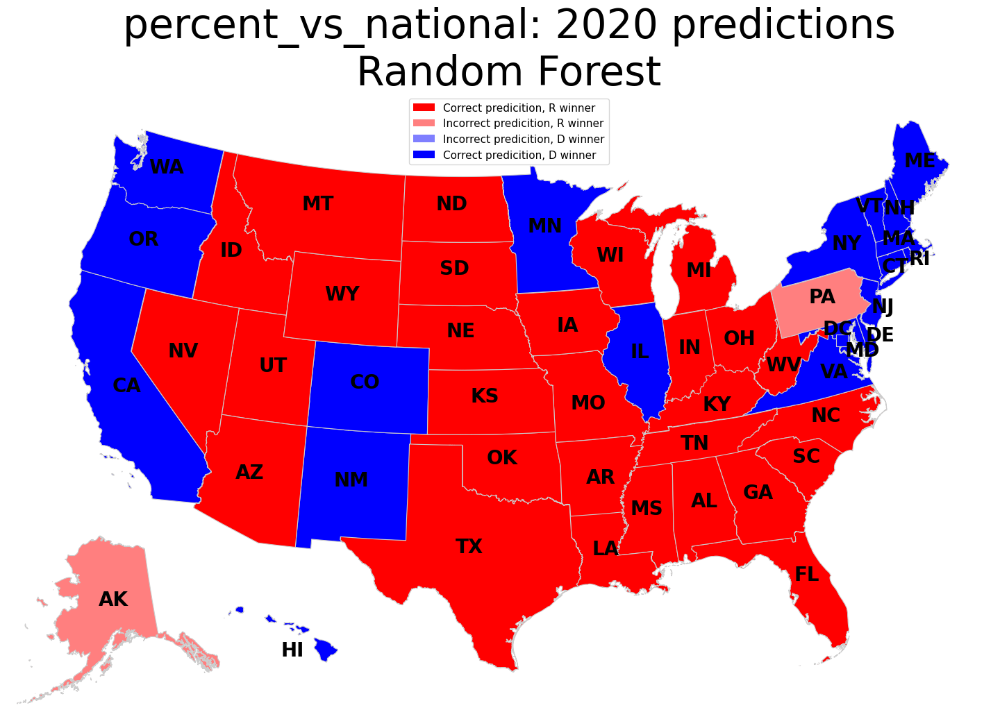

In [95]:
show_result(target_name=target, y_pred=pred_test, model_name='Random Forest')

#### swing_vs_national

In [58]:
target='swing_vs_national'

better than Logistic Regression or SVM, but still not very informative...

In [59]:
RFC = RandomForestClassifier( n_estimators=1000, random_state=rs, oob_score=True, n_jobs=-1, criterion='entropy')
RFC.fit(X_train.values, y_train_df[target].values)
RFC.oob_score_

0.6627450980392157

In [60]:
pred_test = RFC.predict(X_test)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

30.999999999999996

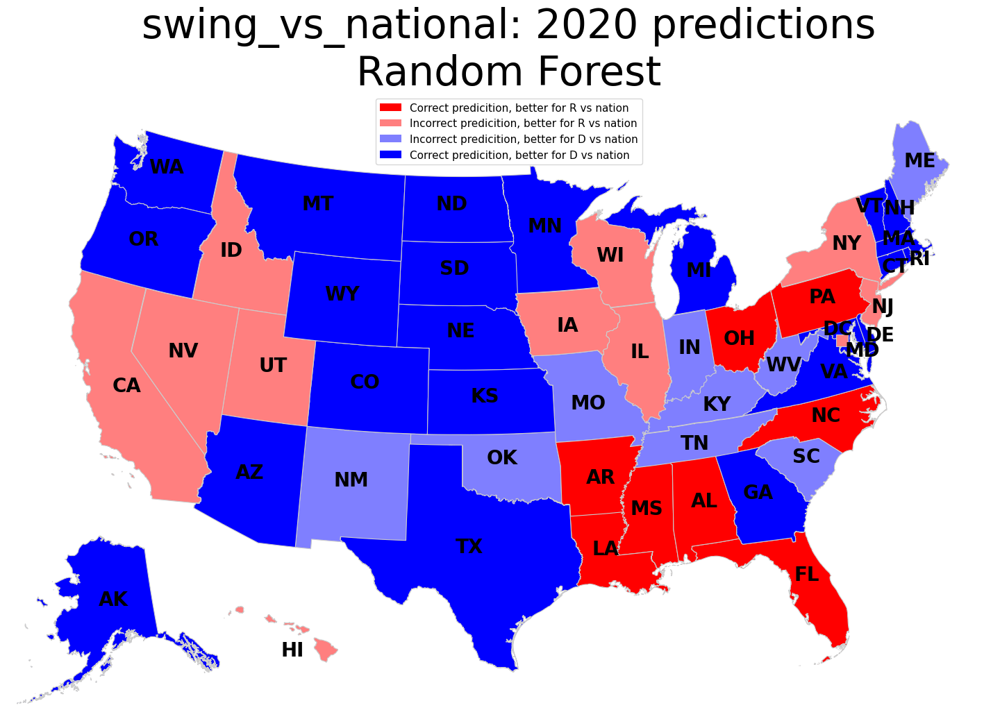

In [61]:
show_result(target_name=target, y_pred=pred_test, model_name='Random Forest')

#### winner_vs_national_winner

In [389]:
target='winner_vs_national_winner'

random forest didn't work for this target

In [410]:
RFC = RandomForestClassifier( n_estimators=200, random_state=rs, oob_score=True, n_jobs=-1)
RFC.fit(X_train.values, y_train_df[target].values)
RFC.oob_score_

0.7509803921568627

In [411]:
pred_test = RFC.predict(X_test)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

27.0

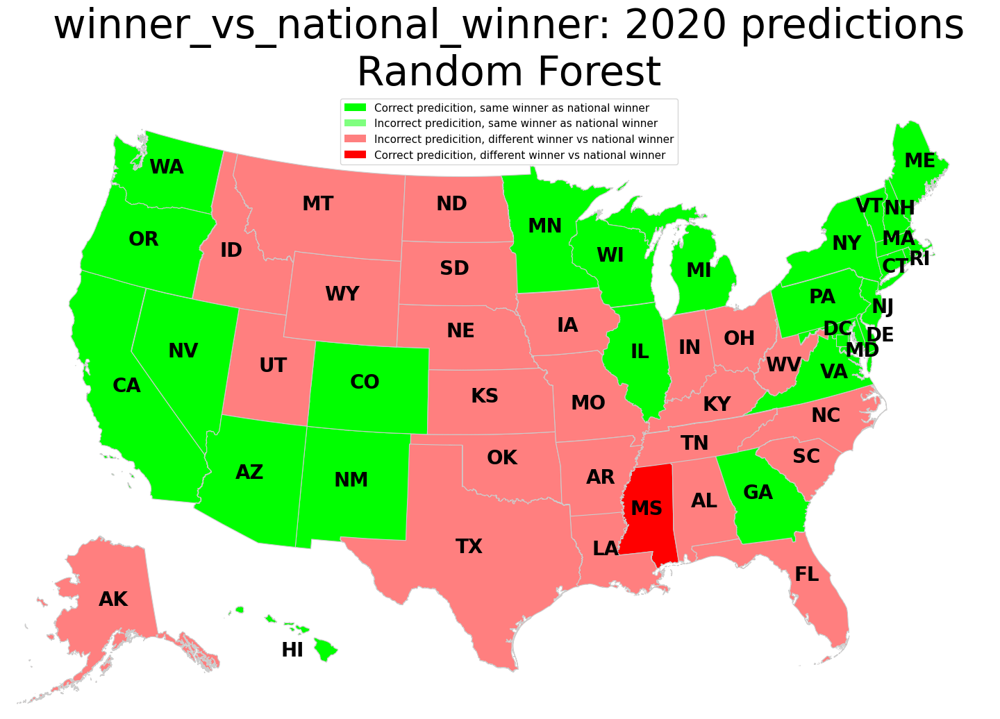

In [412]:
show_result(target_name=target, y_pred=pred_test, model_name='Random Forest')

#### winner_vs_national_pv_winner

In [50]:
target='winner_vs_national_pv_winner'

great Random Forest result. also, it's stable

since this is a very good result already, no further improvements for this target were attempted!

In [51]:
RFC = RandomForestClassifier( n_estimators=400, random_state=rs, oob_score=True, n_jobs=-1)
RFC.fit(X_train.values, y_train_df[target].values)
RFC.oob_score_

0.8098039215686275

In [52]:
pred_test = RFC.predict(X_test)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

48.0

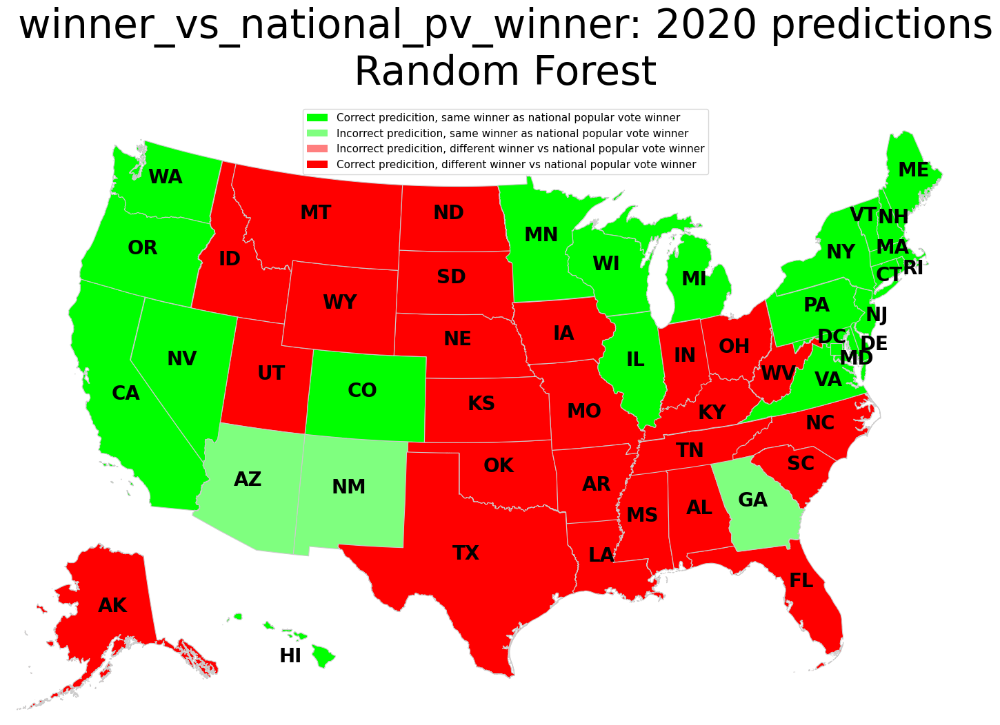

In [53]:
show_result(target_name=target, y_pred=pred_test, model_name='Random Forest')

## GRADIENT BOOSTING

since Boosting is computationally demanding, it was not attempted for the targets where Random Forest already produced great results: percent_vs_national and winner_vs_national_pv_winner

also due to computational limitations, only max_depth, n_trees and learning_rate were searched through during grid search for each of the 4 targets

Each of the 4 grid searches took multiple hours to finish on my laptop. 

The end results were stable, and, unlike for SVM and LR, high CV scores actually led to high test set scores.

But overall the results with the hyperparameters from grid searches are still worse than Random Forest,probably because the scope of the grid search was too narrow

However, I found some better hyperparameters by myself

Note: these grid searches for Boosting could have actually been done with the built-in GridSearchCV, because sample weighting is not available for scikit's GradientBoostingClassifier. With the ability to parallelize GridSearchCV process with n_jobs=-1, the grid searches could have been done much faster.

But, I didn't realize that before the cells executed. Since the results would be the same, I left the inefficient code in.

##### ATTENTION: DO NOT RUN THE GRID SEARCH CELLS. THEY ARE INEFFICIENT AND TAKE TOO LONG TO FINISH

#### winner

In [16]:
boosting_targets=['winner']

DO NOT RUN THIS CELL. IT'S INEFFICIENT AND TAKES TOO LONG TO FINISH

In [17]:
all_boosting_cv_results = list()
for tgt in boosting_targets:
    print(tgt)
    max_depths=[1, 2, 3, 4, 5]
    n_trees= [50, 100, 200, 400, 700, 1000]
    learning_rates= [0.01, 0.05, 0.1, 0.2]

    boosting_cv_results=pd.DataFrame()
    boosting_cv_results['max_depth']=max_depths
    boosting_cv_results['n_estimators']=np.tile(n_trees,(len(max_depths),1)).tolist()
    boosting_cv_results=boosting_cv_results.explode(column='n_estimators').sort_values(by=['max_depth','n_estimators']).reset_index(drop=True)
    boosting_cv_results['learning_rate']=np.tile(learning_rates,(len(n_trees)*len(max_depths),1)).tolist()
    boosting_cv_results=boosting_cv_results.explode(column='learning_rate').sort_values(by=['max_depth','n_estimators','learning_rate']).reset_index(drop=True)
    
    boosting_cv_results['F_one']=np.zeros(boosting_cv_results.shape[0],)
    
    for index, (max_depth, n_estimators, learning_rate, _) in boosting_cv_results.iterrows():
        if (int(index)%10==0):
            print(str(index)+' '+str(max_depth)+' '+str(n_estimators)+''+str(learning_rate))
        f1_scores=[]
        
        for i, (tr_ind, te_id) in enumerate(strat_shuf_split.split(X_train, y_train_df[tgt])):
            X_train_cv = X_train.loc[tr_ind, :]
            y_train_cv = y_train_df.loc[tr_ind, tgt]
            sample_weights_train_cv=sample_weights.loc[tr_ind]
            
            X_valid_cv = X_train.loc[te_id, :]
            y_valid_cv = y_train_df.loc[te_id, tgt]
            sample_weights_valid_cv=sample_weights.loc[te_id]
            
            boosting_model = GradientBoostingClassifier(random_state=rs, 
                                                        n_estimators=n_estimators,
                                                        learning_rate=learning_rate, 
                                                        max_depth=max_depth)

            boosting_model.fit(X_train_cv.values, y_train_cv.values)
            pred = boosting_model.predict(X_valid_cv)
            f1_scores.append(f1_score(y_true=y_valid_cv,y_pred=pred, sample_weight=sample_weights_valid_cv))
        
        boosting_cv_results.iloc[index,3]=np.mean(f1_scores)
    
    top_res_label = pd.MultiIndex(levels=[[tgt], boosting_cv_results.columns.tolist()], 
                            codes=[[0,0,0,0], [0,1,2,3]])
    all_boosting_cv_results.append(pd.DataFrame(boosting_cv_results.sort_values(by='F_one',ascending=False).head(20).to_numpy(), columns=top_res_label))
    print('----------------------')
    
    


winner
0 1 500.01
10 1 2000.1
20 1 10000.01
30 2 1000.1
40 2 7000.01
50 3 500.1
60 3 4000.01
70 3 10000.1
80 4 2000.01
90 4 7000.1
100 5 1000.01
110 5 4000.1
----------------------


In [18]:
all_boosting_cv_results

[      winner                                     
    max_depth n_estimators learning_rate     F_one
 0          5         1000          0.05  0.847713
 1          5          700          0.05  0.847713
 2          4          200           0.2  0.844429
 3          4         1000           0.2  0.842845
 4          4          700           0.2  0.842845
 5          4          400           0.2  0.842845
 6          4          100           0.2  0.842685
 7          2         1000           0.1  0.842173
 8          4          700          0.01  0.842081
 9          5         1000           0.1  0.841073
 10         5          700           0.1  0.841073
 11         5          400           0.1  0.841073
 12         5          100           0.2  0.840226
 13         2          700           0.2  0.839744
 14         2         1000           0.2  0.838904
 15         5         1000          0.01  0.838848
 16         5         1000           0.2  0.838698
 17         5          200     

best results with params from Grid Search. worse than Random Forest 

In [87]:
boosting_model = GradientBoostingClassifier(random_state=rs, 
                                                        n_estimators=700,
                                                        learning_rate=0.05, 
                                                        max_depth=5)
boosting_model.fit(X_train.values, y_train_df['winner'].values)
pred_test = boosting_model.predict(X_test)
51*accuracy_score(y_true=y_test_df['winner'],y_pred=pred_test)

44.0

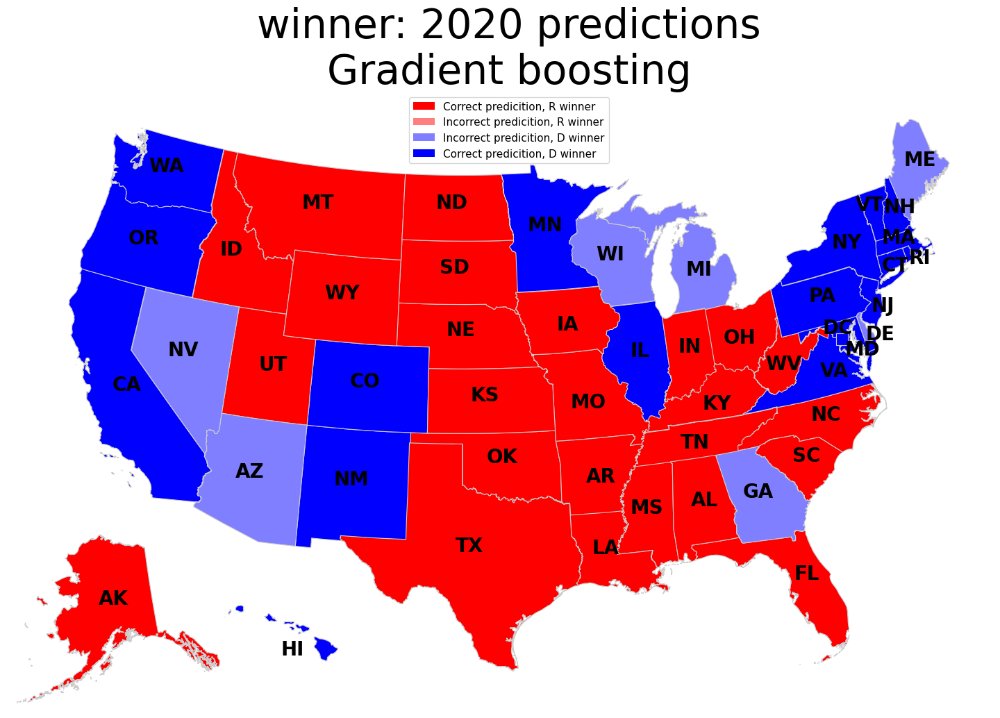

In [89]:
show_result(target_name='winner', y_pred=pred_test, model_name='Gradient boosting')

best results with params found by hand. better than Random Forest

lowers variance thanks to: subsample<1.0, max_features less than default, lower learning_rate

lowers bias thanks to : higher n_estimators, init (maybe)

In [90]:
boosting_model2 = GradientBoostingClassifier(random_state=rs, 
                                                        n_estimators=4000,
                                                        learning_rate=0.01, 
                                                        max_depth=5, 
                                                        max_features ='log2',
                                                        init=SVC(random_state=rs, C=0.1, kernel='poly',degree=1, probability=True),
                                                        subsample=0.8, 
                                                        loss ='exponential'
                                                        )
boosting_model2.fit(X_train.values, y_train_df['winner'].values)
pred_test2 = boosting_model2.predict(X_test)
51*accuracy_score(y_true=y_test_df['winner'],y_pred=pred_test2)

48.0

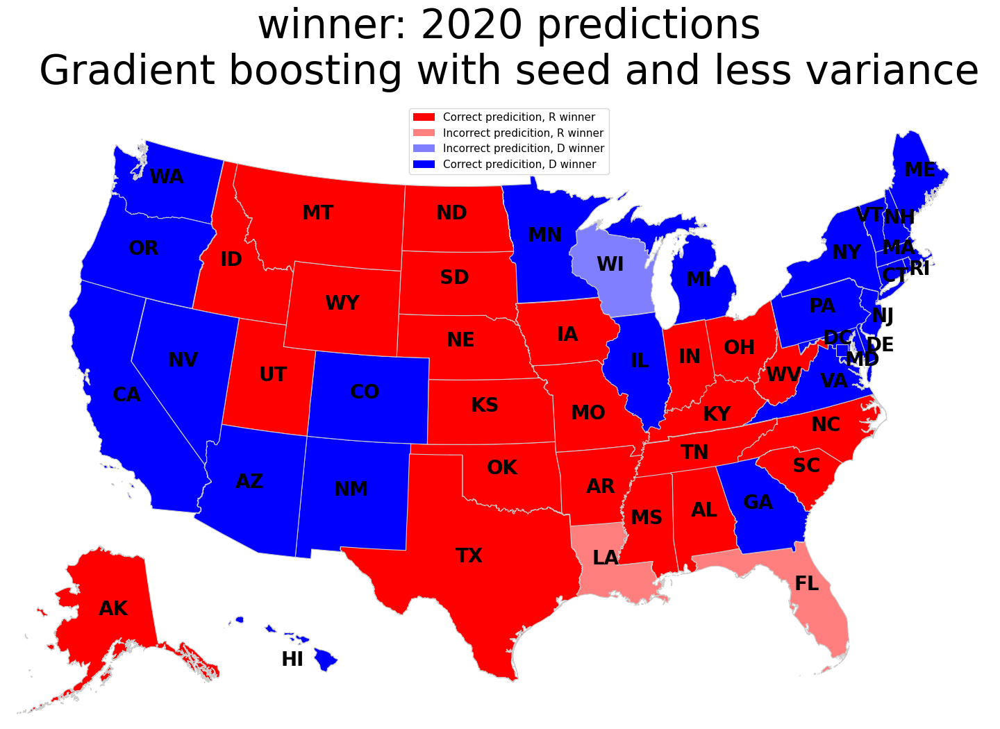

In [91]:
show_result(target_name='winner', y_pred=pred_test2, model_name='Gradient boosting with seed and less variance')

#### swing_vs_national

In [19]:
boosting_targets=['swing_vs_national']

DO NOT RUN THIS CELL. IT'S INEFFICIENT AND TAKES TOO LONG TO FINISH

In [20]:
all_boosting_cv_results2 = list()
for tgt in boosting_targets:
    print(tgt)
    max_depths=[1, 2, 3, 4, 5]
    n_trees= [50, 100, 200, 400, 700, 1000]
    learning_rates= [0.01, 0.05, 0.1, 0.2]

    boosting_cv_results=pd.DataFrame()
    boosting_cv_results['max_depth']=max_depths
    boosting_cv_results['n_estimators']=np.tile(n_trees,(len(max_depths),1)).tolist()
    boosting_cv_results=boosting_cv_results.explode(column='n_estimators').sort_values(by=['max_depth','n_estimators']).reset_index(drop=True)
    boosting_cv_results['learning_rate']=np.tile(learning_rates,(len(n_trees)*len(max_depths),1)).tolist()
    boosting_cv_results=boosting_cv_results.explode(column='learning_rate').sort_values(by=['max_depth','n_estimators','learning_rate']).reset_index(drop=True)
    
    boosting_cv_results['F_one']=np.zeros(boosting_cv_results.shape[0],)
    
    for index, (max_depth, n_estimators, learning_rate, _) in boosting_cv_results.iterrows():
        if (int(index)%10==0):
            print(str(index)+' '+str(max_depth)+' '+str(n_estimators)+''+str(learning_rate))
        f1_scores=[]
        
        for i, (tr_ind, te_id) in enumerate(strat_shuf_split.split(X_train, y_train_df[tgt])):
            X_train_cv = X_train.loc[tr_ind, :]
            y_train_cv = y_train_df.loc[tr_ind, tgt]
            sample_weights_train_cv=sample_weights.loc[tr_ind]
            
            X_valid_cv = X_train.loc[te_id, :]
            y_valid_cv = y_train_df.loc[te_id, tgt]
            sample_weights_valid_cv=sample_weights.loc[te_id]
            
            boosting_model = GradientBoostingClassifier(random_state=rs, 
                                                        n_estimators=n_estimators,
                                                        learning_rate=learning_rate, 
                                                        max_depth=max_depth)

            boosting_model.fit(X_train_cv.values, y_train_cv.values)
            pred = boosting_model.predict(X_valid_cv)
            f1_scores.append(f1_score(y_true=y_valid_cv,y_pred=pred, sample_weight=sample_weights_valid_cv))
        
        boosting_cv_results.iloc[index,3]=np.mean(f1_scores)
    
    top_res_label = pd.MultiIndex(levels=[[tgt], boosting_cv_results.columns.tolist()], 
                            codes=[[0,0,0,0], [0,1,2,3]])
    all_boosting_cv_results2.append(pd.DataFrame(boosting_cv_results.sort_values(by='F_one',ascending=False).head(20).to_numpy(), columns=top_res_label))
    print('----------------------')
    
    


swing_vs_national
0 1 500.01
10 1 2000.1
20 1 10000.01
30 2 1000.1
40 2 7000.01
50 3 500.1
60 3 4000.01
70 3 10000.1
80 4 2000.01
90 4 7000.1
100 5 1000.01
110 5 4000.1
----------------------


In [21]:
all_boosting_cv_results2

[   swing_vs_national                                     
            max_depth n_estimators learning_rate     F_one
 0                  4          200          0.05  0.656147
 1                  4         1000          0.01  0.654771
 2                  4          700          0.01  0.648309
 3                  5         1000          0.01  0.647777
 4                  4           50           0.1  0.646426
 5                  3          100           0.1  0.644602
 6                  4          700          0.05   0.64231
 7                  5          400          0.05  0.640706
 8                  3         1000           0.1  0.638824
 9                  5          700          0.05  0.638706
 10                 4          100          0.05  0.638482
 11                 5         1000           0.1  0.637482
 12                 5          700           0.1  0.637482
 13                 4          400          0.01  0.637278
 14                 5          700          0.01  0.6372

best results with params from Grid Search. worse than Random Forest

In [18]:
boosting_model2 = GradientBoostingClassifier(random_state=rs, 
                                                        n_estimators=1000,
                                                        learning_rate=0.01, 
                                                        max_depth=4)
boosting_model2.fit(X_train.values, y_train_df['swing_vs_national'].values)
pred_test2 = boosting_model2.predict(X_test)
51*accuracy_score(y_true=y_test_df['swing_vs_national'],y_pred=pred_test2)

28.000000000000004

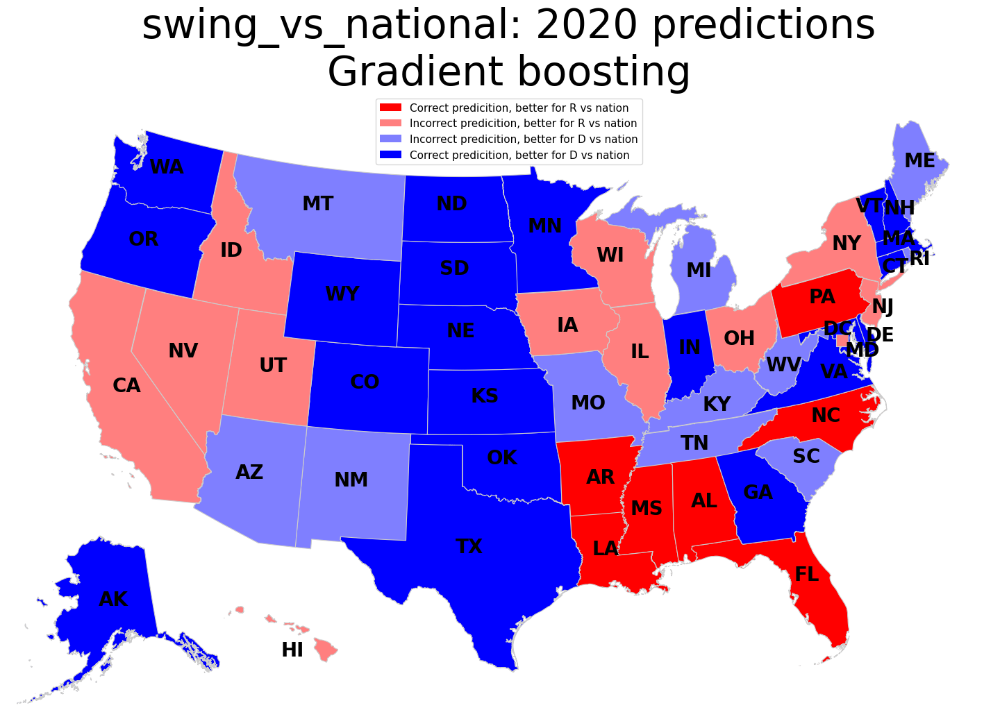

In [19]:
show_result(target_name='swing_vs_national', y_pred=pred_test2, model_name='Gradient boosting')

best results with params found by hand. better than Random Forest

lowers variance thanks to: subsample<1.0, min_impurity_decrease > 0

lowers bias thanks to : higher n_estimators, init (maybe), higher max_depth

In [20]:
boosting_model2 = GradientBoostingClassifier(random_state=rs, 
                                                        n_estimators=1500,
                                                        learning_rate=0.01, 
                                                        max_depth=8,
                                                        init=RandomForestClassifier( n_estimators=1000, random_state=rs, oob_score=True, n_jobs=-1, criterion='entropy'),
                                                        min_impurity_decrease=0.05,
                                                        subsample=0.6, 
                                                        loss ='exponential'
                                                        )
boosting_model2.fit(X_train.values, y_train_df['swing_vs_national'].values)
pred_test2 = boosting_model2.predict(X_test)
51*accuracy_score(y_true=y_test_df['swing_vs_national'],y_pred=pred_test2)

33.0

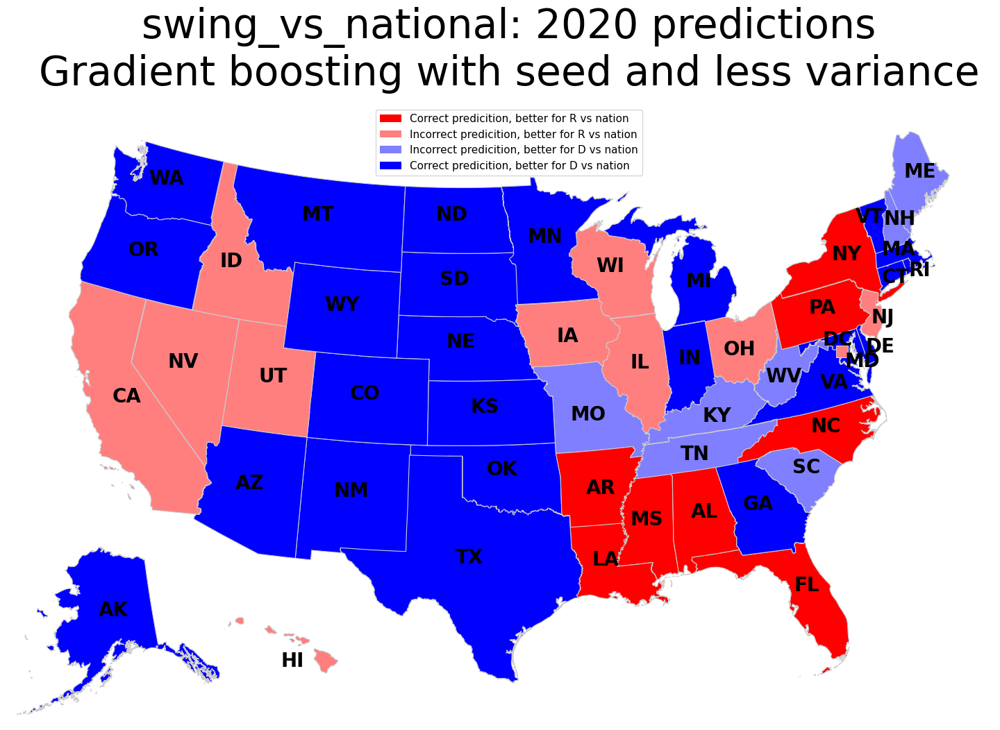

In [21]:
show_result(target_name='swing_vs_national', y_pred=pred_test2, model_name='Gradient boosting with seed and less variance')

#### winner_vs_national_winner

In [23]:
boosting_targets=['winner_vs_national_winner']

no useful models here

DO NOT RUN THIS CELL. IT'S INEFFICIENT AND TAKES TOO LONG TO FINISH

In [24]:
all_boosting_cv_results3 = list()
for tgt in boosting_targets:
    print(tgt)
    max_depths=[1, 2, 3, 4, 5]
    n_trees= [50, 100, 200, 400, 700, 1000]
    learning_rates= [0.01, 0.05, 0.1, 0.2]

    boosting_cv_results=pd.DataFrame()
    boosting_cv_results['max_depth']=max_depths
    boosting_cv_results['n_estimators']=np.tile(n_trees,(len(max_depths),1)).tolist()
    boosting_cv_results=boosting_cv_results.explode(column='n_estimators').sort_values(by=['max_depth','n_estimators']).reset_index(drop=True)
    boosting_cv_results['learning_rate']=np.tile(learning_rates,(len(n_trees)*len(max_depths),1)).tolist()
    boosting_cv_results=boosting_cv_results.explode(column='learning_rate').sort_values(by=['max_depth','n_estimators','learning_rate']).reset_index(drop=True)
    
    boosting_cv_results['F_one']=np.zeros(boosting_cv_results.shape[0],)
    
    for index, (max_depth, n_estimators, learning_rate, _) in boosting_cv_results.iterrows():
        if (int(index)%10==0):
            print(str(index)+' '+str(max_depth)+' '+str(n_estimators)+''+str(learning_rate))
        f1_scores=[]
        
        for i, (tr_ind, te_id) in enumerate(strat_shuf_split.split(X_train, y_train_df[tgt])):
            X_train_cv = X_train.loc[tr_ind, :]
            y_train_cv = y_train_df.loc[tr_ind, tgt]
            sample_weights_train_cv=sample_weights.loc[tr_ind]
            
            X_valid_cv = X_train.loc[te_id, :]
            y_valid_cv = y_train_df.loc[te_id, tgt]
            sample_weights_valid_cv=sample_weights.loc[te_id]
            
            boosting_model = GradientBoostingClassifier(random_state=rs, 
                                                        n_estimators=n_estimators,
                                                        learning_rate=learning_rate, 
                                                        max_depth=max_depth)

            boosting_model.fit(X_train_cv.values, y_train_cv.values)
            pred = boosting_model.predict(X_valid_cv)
            f1_scores.append(f1_score(y_true=y_valid_cv,y_pred=pred, sample_weight=sample_weights_valid_cv))
        
        boosting_cv_results.iloc[index,3]=np.mean(f1_scores)
    
    top_res_label = pd.MultiIndex(levels=[[tgt], boosting_cv_results.columns.tolist()], 
                            codes=[[0,0,0,0], [0,1,2,3]])
    all_boosting_cv_results3.append(pd.DataFrame(boosting_cv_results.sort_values(by='F_one',ascending=False).head(20).to_numpy(), columns=top_res_label))
    print('----------------------')
    
    


winner_vs_national_winner
0 1 500.01
10 1 2000.1
20 1 10000.01
30 2 1000.1
40 2 7000.01
50 3 500.1
60 3 4000.01
70 3 10000.1
80 4 2000.01
90 4 7000.1
100 5 1000.01
110 5 4000.1
----------------------


In [25]:
all_boosting_cv_results3

[   winner_vs_national_winner                                     
                    max_depth n_estimators learning_rate     F_one
 0                          5           50           0.2   0.59059
 1                          5          100           0.2  0.577309
 2                          3         1000          0.01   0.56464
 3                          3         1000          0.05  0.560798
 4                          3          200           0.2  0.558447
 5                          5          200           0.2  0.558023
 6                          5          400           0.1  0.556711
 7                          5          200          0.05  0.556083
 8                          3          400           0.1  0.555967
 9                          3          400           0.2  0.555836
 10                         5          700           0.1  0.555417
 11                         5         1000           0.1  0.555417
 12                         5          400          0.05  0.55

In [94]:
boosting_model = GradientBoostingClassifier(random_state=rs, 
                                                        n_estimators=50,
                                                        learning_rate=0.2, 
                                                        max_depth=5)
boosting_model.fit(X_train.values, y_train_df['winner_vs_national_winner'].values)
pred_test = boosting_model.predict(X_test)
51*accuracy_score(y_true=y_test_df['winner_vs_national_winner'],y_pred=pred_test)

27.0

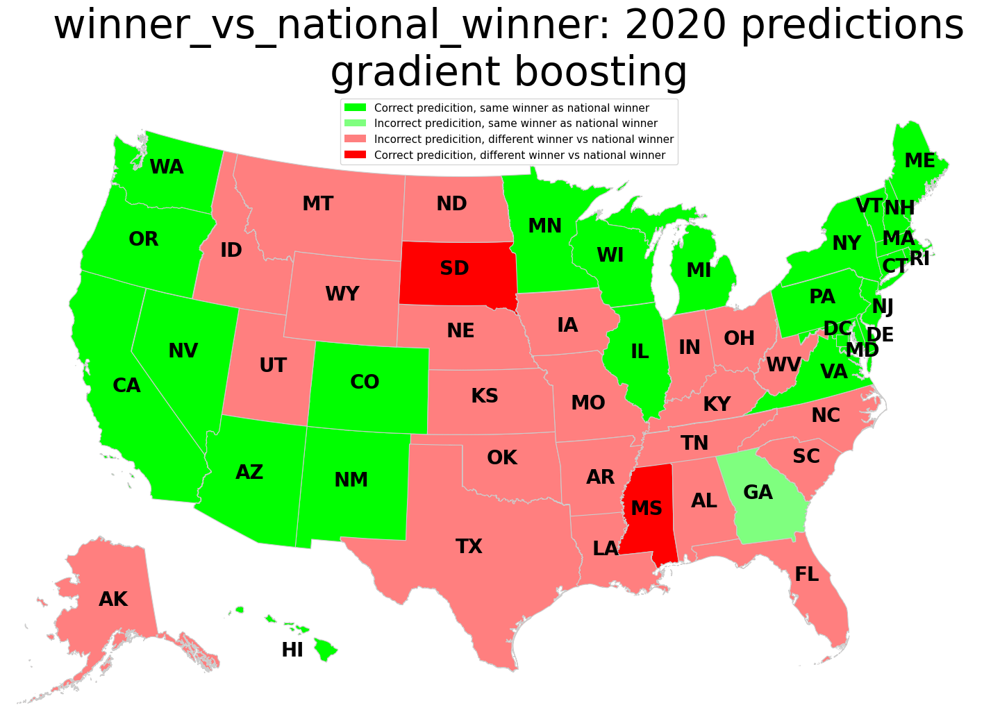

In [95]:
show_result(target_name='winner_vs_national_winner', y_pred=pred_test, model_name='gradient boosting')

#### swing

In [26]:
boosting_targets=['swing']

no useful models here. i've given up on swing 

DO NOT RUN THIS CELL. IT'S INEFFICIENT AND TAKES TOO LONG TO FINISH

In [27]:
all_boosting_cv_results4 = list()
for tgt in boosting_targets:
    print(tgt)
    max_depths=[1, 2, 3, 4, 5]
    n_trees= [50, 100, 200, 400, 700, 1000]
    learning_rates= [0.01, 0.05, 0.1, 0.2]

    boosting_cv_results=pd.DataFrame()
    boosting_cv_results['max_depth']=max_depths
    boosting_cv_results['n_estimators']=np.tile(n_trees,(len(max_depths),1)).tolist()
    boosting_cv_results=boosting_cv_results.explode(column='n_estimators').sort_values(by=['max_depth','n_estimators']).reset_index(drop=True)
    boosting_cv_results['learning_rate']=np.tile(learning_rates,(len(n_trees)*len(max_depths),1)).tolist()
    boosting_cv_results=boosting_cv_results.explode(column='learning_rate').sort_values(by=['max_depth','n_estimators','learning_rate']).reset_index(drop=True)
    
    boosting_cv_results['F_one']=np.zeros(boosting_cv_results.shape[0],)
    
    for index, (max_depth, n_estimators, learning_rate, _) in boosting_cv_results.iterrows():
        if (int(index)%10==0):
            print(str(index)+' '+str(max_depth)+' '+str(n_estimators)+''+str(learning_rate))
        f1_scores=[]
        
        for i, (tr_ind, te_id) in enumerate(strat_shuf_split.split(X_train, y_train_df[tgt])):
            X_train_cv = X_train.loc[tr_ind, :]
            y_train_cv = y_train_df.loc[tr_ind, tgt]
            sample_weights_train_cv=sample_weights.loc[tr_ind]
            
            X_valid_cv = X_train.loc[te_id, :]
            y_valid_cv = y_train_df.loc[te_id, tgt]
            sample_weights_valid_cv=sample_weights.loc[te_id]
            
            boosting_model = GradientBoostingClassifier(random_state=rs, 
                                                        n_estimators=n_estimators,
                                                        learning_rate=learning_rate, 
                                                        max_depth=max_depth)

            boosting_model.fit(X_train_cv.values, y_train_cv.values)
            pred = boosting_model.predict(X_valid_cv)
            f1_scores.append(f1_score(y_true=y_valid_cv,y_pred=pred, sample_weight=sample_weights_valid_cv))
        
        boosting_cv_results.iloc[index,3]=np.mean(f1_scores)
    
    top_res_label = pd.MultiIndex(levels=[[tgt], boosting_cv_results.columns.tolist()], 
                            codes=[[0,0,0,0], [0,1,2,3]])
    all_boosting_cv_results4.append(pd.DataFrame(boosting_cv_results.sort_values(by='F_one',ascending=False).head(20).to_numpy(), columns=top_res_label))
    print('----------------------')
    
    


swing
0 1 500.01
10 1 2000.1
20 1 10000.01
30 2 1000.1
40 2 7000.01
50 3 500.1
60 3 4000.01
70 3 10000.1
80 4 2000.01
90 4 7000.1
100 5 1000.01
110 5 4000.1
----------------------


In [28]:
all_boosting_cv_results4

[       swing                                     
    max_depth n_estimators learning_rate     F_one
 0          1          700          0.05  0.798097
 1          2          400           0.2   0.79705
 2          2          400           0.1  0.796283
 3          1          400           0.1   0.79624
 4          2          200           0.1  0.794663
 5          2          400          0.05  0.794354
 6          1          700           0.2  0.794339
 7          1          400          0.05  0.792843
 8          3          400          0.05  0.792045
 9          2         1000           0.1  0.791671
 10         1         1000           0.2  0.791646
 11         1          200          0.05  0.791295
 12         1         1000          0.05  0.791148
 13         1          200           0.1  0.791143
 14         1         1000           0.1  0.790365
 15         2          700          0.05  0.790349
 16         1          400           0.2  0.790109
 17         2          700     

In [22]:
boosting_model = GradientBoostingClassifier(random_state=rs, 
                                                        n_estimators=700,
                                                        learning_rate=0.05, 
                                                        max_depth=1)
boosting_model.fit(X_train.values, y_train_df['swing'].values)
pred_test = boosting_model.predict(X_test)
51*accuracy_score(y_true=y_test_df['swing'],y_pred=pred_test)

39.0

In [23]:
balanced_accuracy_score(y_true=y_test_df['swing'],y_pred=pred_test)

0.4431818181818182

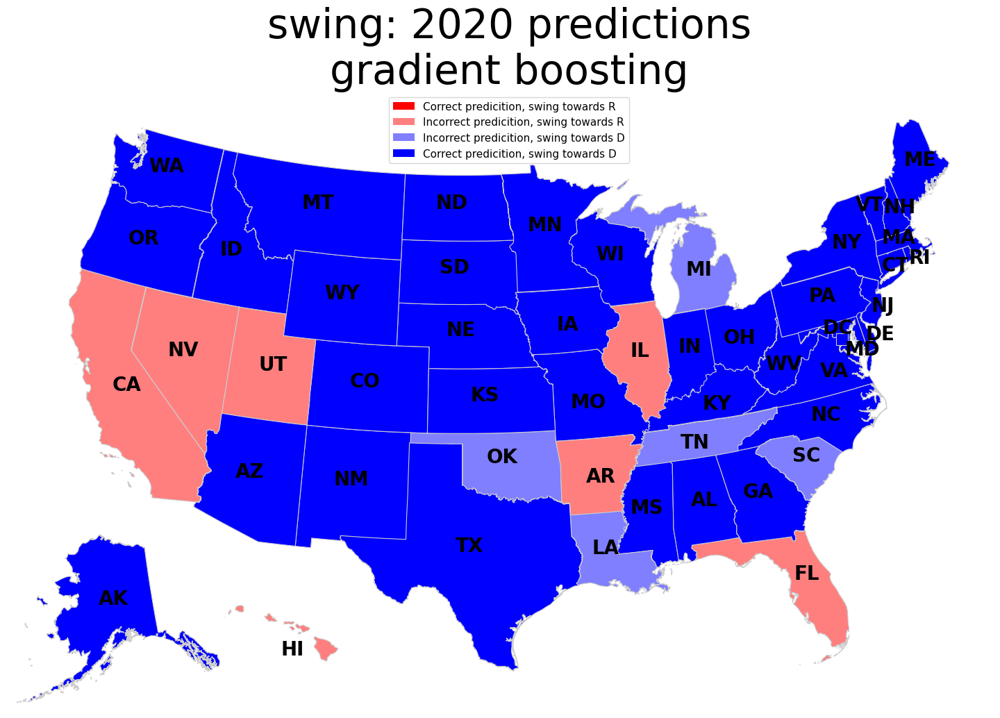

In [24]:
show_result(target_name='swing', y_pred=pred_test, model_name='gradient boosting')

In [25]:
boosting_model2 = GradientBoostingClassifier(random_state=rs, 
                                                        n_estimators=400,
                                                        learning_rate=0.2, 
                                                        max_depth=2)
boosting_model2.fit(X_train.values, y_train_df['swing'].values)
pred_test2 = boosting_model2.predict(X_test)
51*accuracy_score(y_true=y_test_df['swing'],y_pred=pred_test2)

19.0

In [26]:
balanced_accuracy_score(y_true=y_test_df['swing'],y_pred=pred_test2)

0.336038961038961

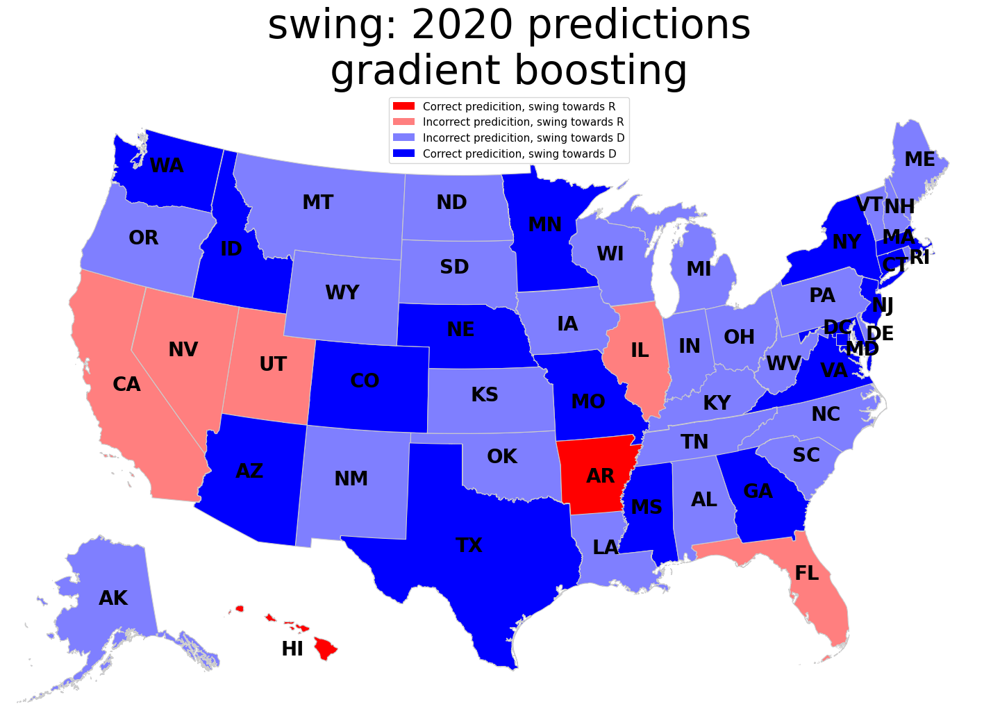

In [27]:
show_result(target_name='swing', y_pred=pred_test2, model_name='gradient boosting')

## STACKING

Model stacking was attempted only for winner and winner_vs_national_winner.

No cross-validation of the meta-model due to computational limitations.

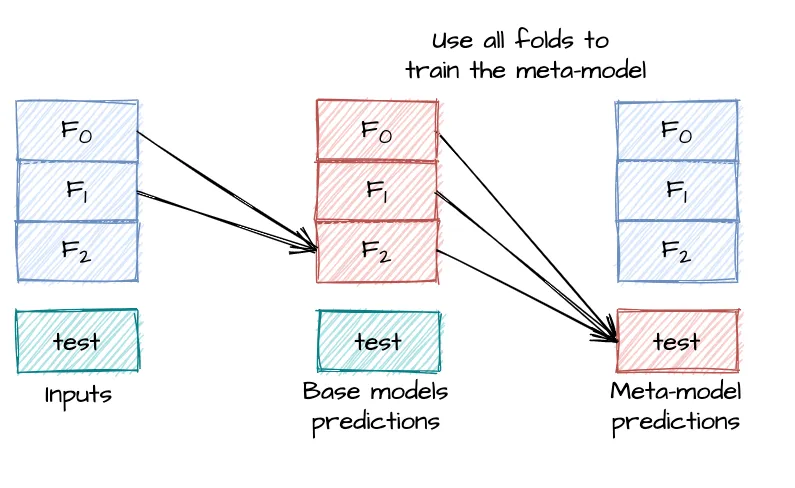

Training set for meta-model: 3 folds, each predicted after base models learn 2 other folds.

Meta-model inference: base models trained on the whole test set, predict train set.

Training with folds to avoid overfitting. Link th the article:
https://towardsdatascience.com/how-to-properly-validate-a-model-when-stacking-ad2ee1b2b9c

#### winner

ATTENTION: these cells can take a few minutes to run 

Picking 9 best-performing base models of various types

In [62]:
target='winner'

base_models = [LogisticRegression(random_state=rs,max_iter=max_iter,solver='saga', penalty='elasticnet',C=0.1, l1_ratio=0.8),
               LogisticRegression(random_state=rs,max_iter=max_iter,solver='saga', penalty='elasticnet',C=0.01, l1_ratio=0.8), 
               SVC(random_state=rs, C=1.0, kernel='poly',degree=2, probability=True), 
               SVC(random_state=rs, C=100.0, kernel='poly',degree=1, probability=True), 
               SVC(random_state=rs, C=0.1, kernel='poly',degree=1, probability=True),
               RandomForestClassifier(n_estimators=600, random_state=rs, n_jobs=-1, criterion='entropy'),
               RandomForestClassifier( n_estimators=300, random_state=rs, n_jobs=-1), 
               GradientBoostingClassifier(random_state=rs, 
                                                        n_estimators=4000,
                                                        learning_rate=0.01, 
                                                        max_depth=5, 
                                                        max_features ='log2',
                                                        init=SVC(random_state=rs, C=0.1, kernel='poly',degree=1, probability=True),
                                                        loss ='exponential'), 
               GradientBoostingClassifier(random_state=rs, n_estimators=400, learning_rate=0.2, max_depth=4)
               ]
stacking_kfold=StratifiedKFold(n_splits=3, shuffle=True, random_state=rs)



creating train set for meta model

In [63]:
alt_winner_base_models_predicted_probs=pd.DataFrame()

for i, (tr_ind, te_id) in enumerate(stacking_kfold.split(X_train, y_train_df[target])):
    X_train_fold = X_train.loc[tr_ind, :]
    y_train_fold = y_train_df.loc[tr_ind, target]
    X_pred_fold = X_train.loc[te_id, :]

    fold_predicted_probs=pd.DataFrame()
    fold_predicted_probs['id']=te_id
    fold_predicted_probs['target']=y_train_df.loc[te_id, target].values
    
    for model in base_models:
        print(f'fitting model {model} to fold {i}')
        model.fit(X_train_fold.values, y_train_fold.values)
        fold_predicted_probs[str(model)]=model.predict_proba(X_pred_fold).T[0]
        
    alt_winner_base_models_predicted_probs=pd.concat([alt_winner_base_models_predicted_probs,fold_predicted_probs],ignore_index=True)

fitting model LogisticRegression(C=0.1, l1_ratio=0.8, max_iter=100000, penalty='elasticnet',
                   random_state=123, solver='saga') to fold 0
fitting model LogisticRegression(C=0.01, l1_ratio=0.8, max_iter=100000, penalty='elasticnet',
                   random_state=123, solver='saga') to fold 0
fitting model SVC(degree=2, kernel='poly', probability=True, random_state=123) to fold 0
fitting model SVC(C=100.0, degree=1, kernel='poly', probability=True, random_state=123) to fold 0
fitting model SVC(C=0.1, degree=1, kernel='poly', probability=True, random_state=123) to fold 0
fitting model RandomForestClassifier(criterion='entropy', n_estimators=600, n_jobs=-1,
                       random_state=123) to fold 0
fitting model RandomForestClassifier(n_estimators=300, n_jobs=-1, random_state=123) to fold 0
fitting model GradientBoostingClassifier(init=SVC(C=0.1, degree=1, kernel='poly',
                                    probability=True, random_state=123),
                   

In [64]:
alt_winner_base_models_predicted_probs.sort_values(by='id', inplace=True, ignore_index=True)

checking whether the meta model train set is correctly constructed

In [65]:
(alt_winner_base_models_predicted_probs.id.to_numpy()==np.arange(510)).all()

True

In [66]:
(alt_winner_base_models_predicted_probs.target.to_numpy()==y_train_df.loc[:, target].values).all()

True

In [67]:
X_train_meta_model=alt_winner_base_models_predicted_probs.drop(columns=['id','target'])
y_train_meta_model=alt_winner_base_models_predicted_probs.target

meta-model test set. also takes a few minutes to finish

In [68]:
X_test_meta_model=pd.DataFrame()
for model in base_models:
    model.fit(X_train.values, y_train_df.loc[:, target].values)
    X_test_meta_model[str(model)]=model.predict_proba(X_test).T[0]

using the meta-model

In [69]:
from sklearn.svm import LinearSVC

In [70]:
meta_model=LinearSVC(random_state=rs, C=10)
meta_model.fit(X_train_meta_model,y_train_meta_model)

LinearSVC(C=10, random_state=123)

In [71]:
pred=meta_model.predict(X_train_meta_model)
f1_score(y_true=y_train_meta_model,y_pred=pred, sample_weight=sample_weights)

0.8747680890538033

In [72]:
pred_test=meta_model.predict(X_test_meta_model)
f1_score(y_true=y_test_df[target],y_pred=pred_test)

0.9600000000000001

In [73]:
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

49.0

the best result for winner!

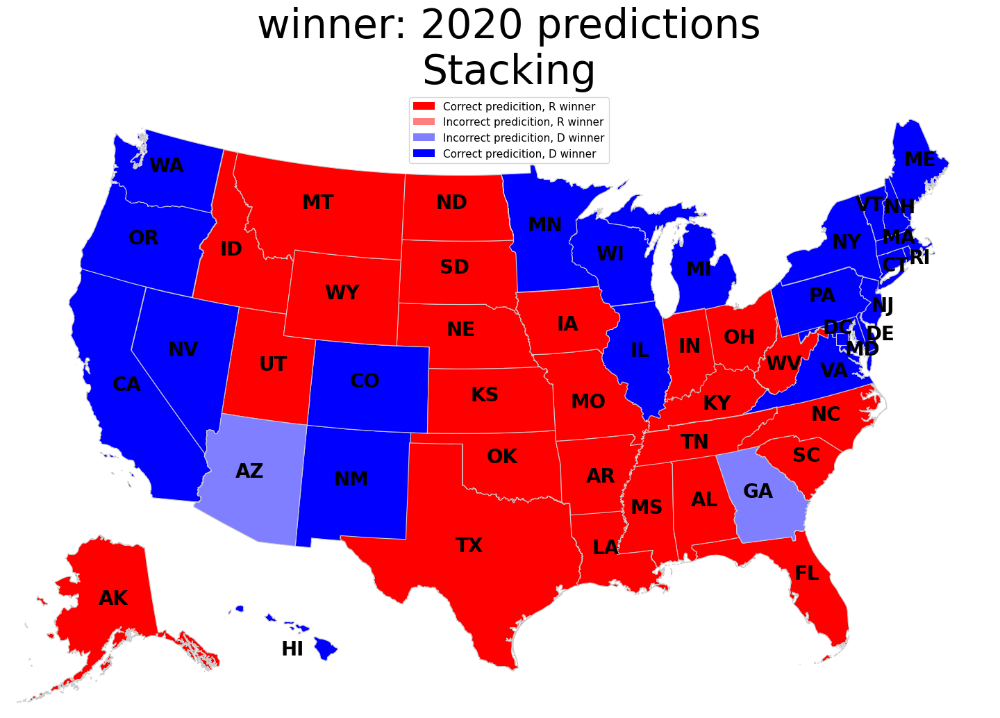

In [74]:
show_result(target_name=target, y_pred=pred_test, model_name='Stacking')

#### winner_vs_national_winner

here, I just picked many base models, around half of them predicting all 0s, and the other half predicting all 1s

In [75]:
target='winner_vs_national_winner'

base_models = [LogisticRegression(random_state=rs),
               LogisticRegression(random_state=rs, solver='saga',penalty='elasticnet', l1_ratio=1.0, C=1), 
               SVC(random_state=rs, C=0.1, kernel='poly',degree=6, probability=True), 
               SVC(random_state=rs, C=0.01, kernel='poly',degree=8, probability=True), 
               SVC(random_state=rs, C=1.0, kernel='poly',degree=3, probability=True),
               RandomForestClassifier(n_estimators=400, random_state=rs, n_jobs=-1), 
               RandomForestClassifier( n_estimators=200, random_state=rs, n_jobs=-1), 
               GradientBoostingClassifier(random_state=rs, n_estimators=50, learning_rate=0.2, max_depth=5), 
               GradientBoostingClassifier(random_state=rs, n_estimators=100, learning_rate=0.2, max_depth=5)
               ]
stacking_kfold=StratifiedKFold(n_splits=3, shuffle=True, random_state=rs)



In [76]:
wvnw_base_models_predicted_probs=pd.DataFrame()

for i, (tr_ind, te_id) in enumerate(stacking_kfold.split(X_train, y_train_df[target])):
    X_train_fold = X_train.loc[tr_ind, :]
    y_train_fold = y_train_df.loc[tr_ind, target]
    X_pred_fold = X_train.loc[te_id, :]

    fold_predicted_probs=pd.DataFrame()
    fold_predicted_probs['id']=te_id
    fold_predicted_probs['target']=y_train_df.loc[te_id, target].values
    
    for model in base_models:
        print(f'fitting model {model} to fold {i}')
        model.fit(X_train_fold.values, y_train_fold.values)
        fold_predicted_probs[str(model)]=model.predict_proba(X_pred_fold).T[0]
        
    wvnw_base_models_predicted_probs=pd.concat([wvnw_base_models_predicted_probs,fold_predicted_probs],ignore_index=True)

fitting model LogisticRegression(random_state=123) to fold 0
fitting model LogisticRegression(C=1, l1_ratio=1.0, penalty='elasticnet', random_state=123,
                   solver='saga') to fold 0
fitting model SVC(C=0.1, degree=6, kernel='poly', probability=True, random_state=123) to fold 0
fitting model SVC(C=0.01, degree=8, kernel='poly', probability=True, random_state=123) to fold 0
fitting model SVC(kernel='poly', probability=True, random_state=123) to fold 0
fitting model RandomForestClassifier(n_estimators=400, n_jobs=-1, random_state=123) to fold 0
fitting model RandomForestClassifier(n_estimators=200, n_jobs=-1, random_state=123) to fold 0
fitting model GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=50,
                           random_state=123) to fold 0
fitting model GradientBoostingClassifier(learning_rate=0.2, max_depth=5, random_state=123) to fold 0
fitting model LogisticRegression(random_state=123) to fold 1
fitting model LogisticRegression(C=1

In [77]:
wvnw_base_models_predicted_probs.sort_values(by='id', inplace=True, ignore_index=True)

In [78]:
(wvnw_base_models_predicted_probs.id.to_numpy()==np.arange(510)).all()

True

In [79]:
(wvnw_base_models_predicted_probs.target.to_numpy()==y_train_df.loc[:, target].values).all()

True

In [80]:
X_train_meta_model=wvnw_base_models_predicted_probs.drop(columns=['id','target'])
y_train_meta_model=wvnw_base_models_predicted_probs.target

In [81]:
X_test_meta_model=pd.DataFrame()
for model in base_models:
    model.fit(X_train.values, y_train_df.loc[:, target].values)
    X_test_meta_model[str(model)]=model.predict_proba(X_test).T[0]

In [82]:
meta_model=LogisticRegression(random_state=rs, C=100)
meta_model.fit(X_train_meta_model,y_train_meta_model)

LogisticRegression(C=100, random_state=123)

In [83]:
pred=meta_model.predict(X_train_meta_model)
f1_score(y_true=y_train_meta_model,y_pred=pred, sample_weight=sample_weights)

0.6105900151285931

In [84]:
pred_test=meta_model.predict(X_test_meta_model)
f1_score(y_true=y_test_df[target],y_pred=pred_test)

0.5263157894736842

In [85]:
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

33.0

a much better result foe this target than with any single base model

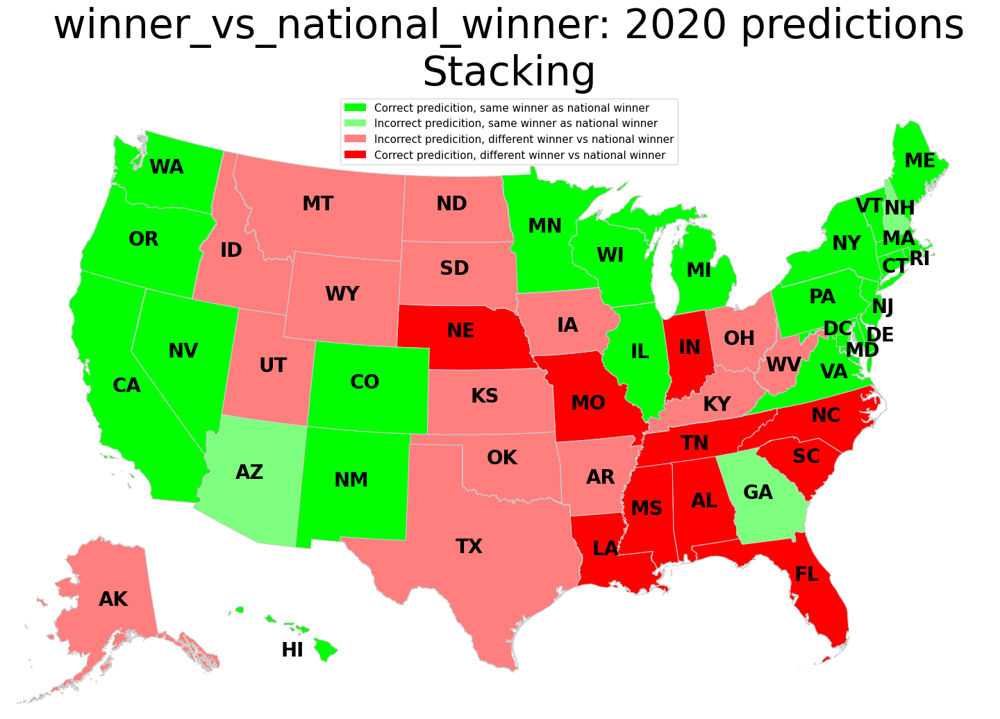

In [86]:
show_result(target_name=target, y_pred=pred_test, model_name='Stacking')

## MODEL EXPLANANTIONS

choosing this well-performing random forest model to explain in 3 diffrent ways

In [18]:
target='percent_vs_national'

In [19]:
RFC = RandomForestClassifier( n_estimators=400, random_state=rs, n_jobs=-1)
RFC.fit(X_train, y_train_df[target])

RandomForestClassifier(n_estimators=400, n_jobs=-1, random_state=123)

In [20]:
pred=RFC.predict(X_train)
accuracy_score(y_true=y_train_df[target],y_pred=pred, sample_weight=sample_weights)

1.0

In [21]:
pred_test = RFC.predict(X_test)
51*accuracy_score(y_true=y_test_df[target],y_pred=pred_test)

49.0

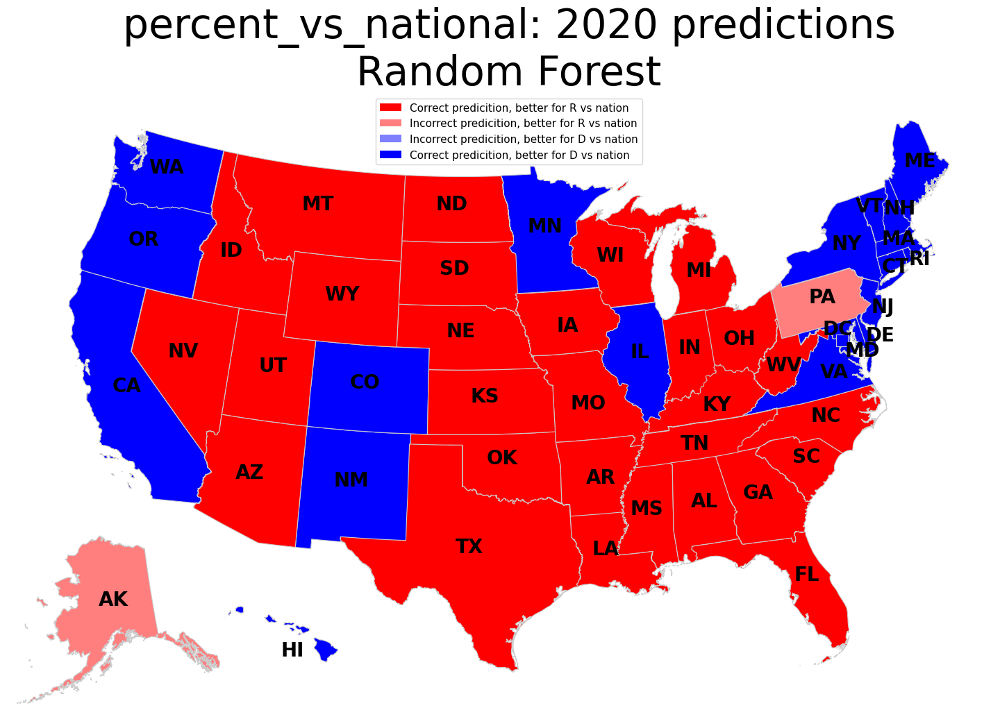

In [22]:
show_result(target_name=target, y_pred=pred_test, model_name='Random Forest')

In [23]:
categorical_political_columns=X_train.columns[-57:]
numerical_economic_columns=X_train.columns[:-57]

#### MDI importance

MDI importance: only looking at categorical features, since it inflates the importance of numerical ones

In [24]:
mdi_importances = pd.Series(
    RFC.feature_importances_, index=RFC.feature_names_in_
)

In [25]:
mdi_importances=mdi_importances.loc[categorical_political_columns].sort_values(ascending=False)
mdi_importances

state_Alaska                  0.001701
state_Maine                   0.001348
state_New Mexico              0.001274
state_Iowa                    0.001194
state_Ohio                    0.000900
state_Hawaii                  0.000845
state_Vermont                 0.000757
state_Nevada                  0.000661
state_Kansas                  0.000507
state_Oregon                  0.000455
state_Maryland                0.000386
state_Colorado                0.000318
state_Washington              0.000278
state_Delaware                0.000275
state_Virginia                0.000218
state_New Jersey              0.000212
state_Tennessee               0.000185
state_Arkansas                0.000174
d_el_winner_8y_ago            0.000157
state_District of Columbia    0.000151
state_Texas                   0.000130
state_North Carolina          0.000127
state_Missouri                0.000118
state_Rhode Island            0.000114
incumbent_running             0.000106
state_Pennsylvania       

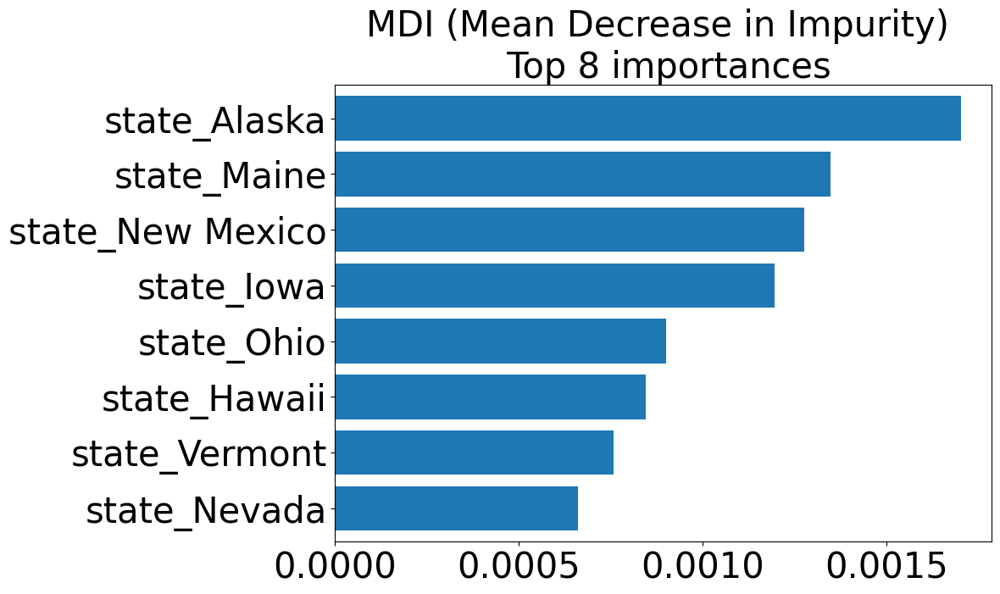

In [26]:
fig, ax = plt.subplots()
fig.set_figwidth(10)
fig.set_figheight(7)
top=8
y_pos=np.arange(top)

ax.barh(y_pos, np.flip(mdi_importances.iloc[:top]))
ax.set_yticks(y_pos, labels=np.flip(mdi_importances.index[:top]));
ax.tick_params(axis='both', labelsize=30);
ax.set_ylim(bottom=-0.6, top=top-0.4)
ax.set_title(f'MDI (Mean Decrease in Impurity) \n Top {top} importances', fontsize=30)
fig.savefig(f'top_{top}_MDI_importances.png',dpi=400, bbox_inches="tight");

#### permutation importance

permutation importance: lookin at all features.

this takes a few minutes to run

In [129]:
permimp = permutation_importance(estimator = RFC,
                                 X=X_test, 
                                 y=y_test_df[target], 
                                 n_repeats=10,
                                 scoring='accuracy',
                                 random_state=rs, 
                                 n_jobs=-1)

In [130]:
importances=pd.DataFrame(
    permimp.importances,
    index=X_test.columns
)
importances['mean']=permimp.importances_mean

In [131]:
importances.shape

(333, 11)

In [132]:
nonzero_importances=importances[(importances!=0).any(axis=1)]
nonzero_importances.shape

(53, 11)

only 53 have non-zero value, 51 economical and dummies for alaska and maine

In [133]:
for_plot=nonzero_importances.sort_values(by='mean', ascending=False)[['mean']]
for_plot

,mean
"vn_pc_Personal current taxes, Thousands of dollars",0.033333
"vn_pc_Public assistance medical care benefits, Thousands of dollars",0.031373
"vn_pc_Employee and self-employed contributions for government social insurance, Millions of dollars",0.029412
"vn_pc_Veterans' life insurance benefits, Thousands of dollars",0.027451
"vn_pc_Family assistance, Thousands of dollars",0.027451
"vn_pc_Medical benefits, Thousands of dollars",0.025490
"vn_Average wages and salaries, Dollars",0.021569
"vn_Per capita rent, Dollars",0.017647
state_Maine,0.017647
"1ych_pc_Railroad retirement and disability benefits, Thousands of dollars",0.015686


In [134]:
for_plot.reset_index(inplace=True)

In [135]:
plot_df=for_plot[(for_plot['mean'] > 0.014) | (for_plot['index']=='state_Alaska')].sort_values(by='mean').set_index('index')

In [136]:
plot_df.shape

(14, 1)

plot some of the most important features + alaska for comparison

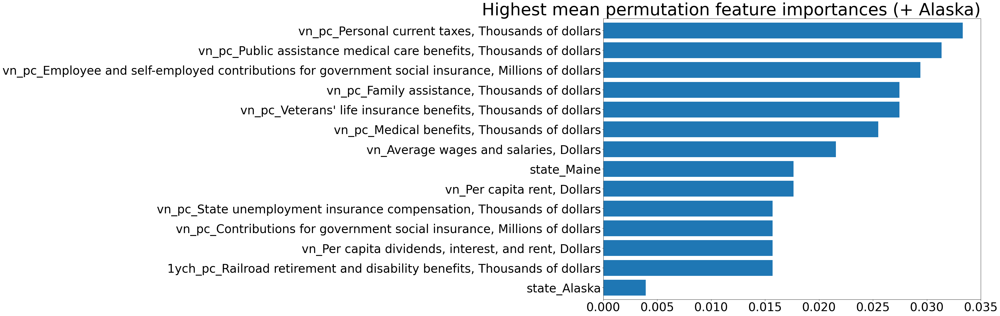

In [137]:
fig, ax = plt.subplots()
fig.set_figwidth(20)
fig.set_figheight(15)
y_pos=np.arange(plot_df.shape[0])

ax.barh(y_pos, plot_df['mean'])
ax.set_yticks(y_pos, labels=plot_df.index);
ax.tick_params(axis='both', labelsize=35);
ax.set_ylim(bottom=-0.6, top=13.6)
ax.set_title('Highest mean permutation feature importances (+ Alaska)', fontsize=50,loc='right')
fig.savefig('permutation_feature_importances.png',dpi=400, bbox_inches="tight");

#### LIME 

needs the separate lime package

WARNING: lime is unstable. you may not be able to reproduce the exact results. But the most important features should be the same

In [56]:
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_test.values,
    mode='classification',
    class_names = ['More R vs nation', 'More D vs nation'],
    feature_names=list(X_test.columns),
    random_state=rs,
    verbose=True)

In [57]:
states_index_in_test=pd.DataFrame([x[6:] for x in X_test.columns[-51:]])
states_index_in_test['id']=states_index_in_test.index
states_index_in_test.set_index(0, inplace=True)

look at alaska: one of only 2 mistakes, even though dummy variable was important

In [60]:
state='Alaska'

instance_index = states_index_in_test.loc[state,'id']
lime_test_instance=X_test.iloc[instance_index].values

exp = explainer.explain_instance(
                                 # Instance to explain
                                 lime_test_instance, 
                                 # The prediction from black-box model
                                 RFC.predict_proba,
                                 # Use max 10 features
                                 num_features=10)

Intercept 0.492036017818954
Prediction_local [0.56409322]
Right: 0.52


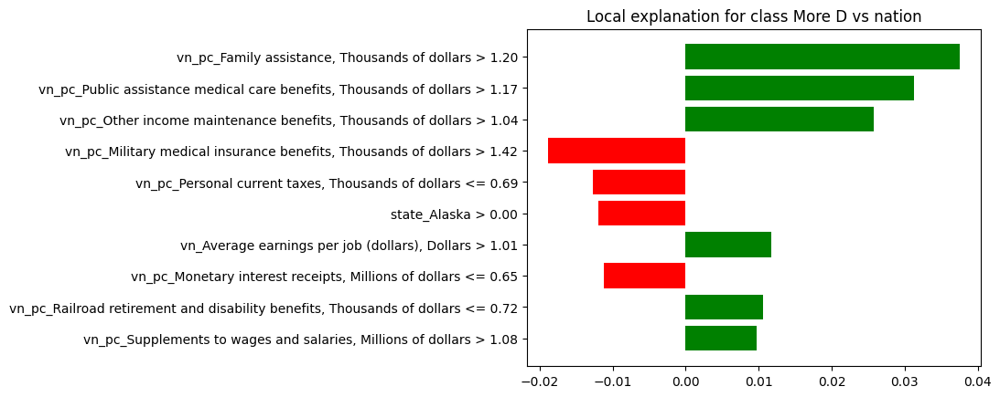

In [61]:
fig=exp.as_pyplot_figure();
fig.savefig('lime_'+state+'.png',dpi=400, bbox_inches="tight");

plot how some of those conditions divide the test set

In [67]:
feature=X_test[['vn_pc_Family assistance, Thousands of dollars']]
indeces=feature[feature['vn_pc_Family assistance, Thousands of dollars']>1.20].index.tolist()
indeces

[1, 4, 7, 8, 13, 21, 22, 30, 31, 32, 39, 45, 47]

In [68]:
def get_color_expl(value):
    if value==0:
        return '#d3d3d3'
    if value==1:
        return '#d3d3d3'
    if value==10:
        return '#ff0000'
    if value==11:
        return '#0000ff'
    return '#000000'

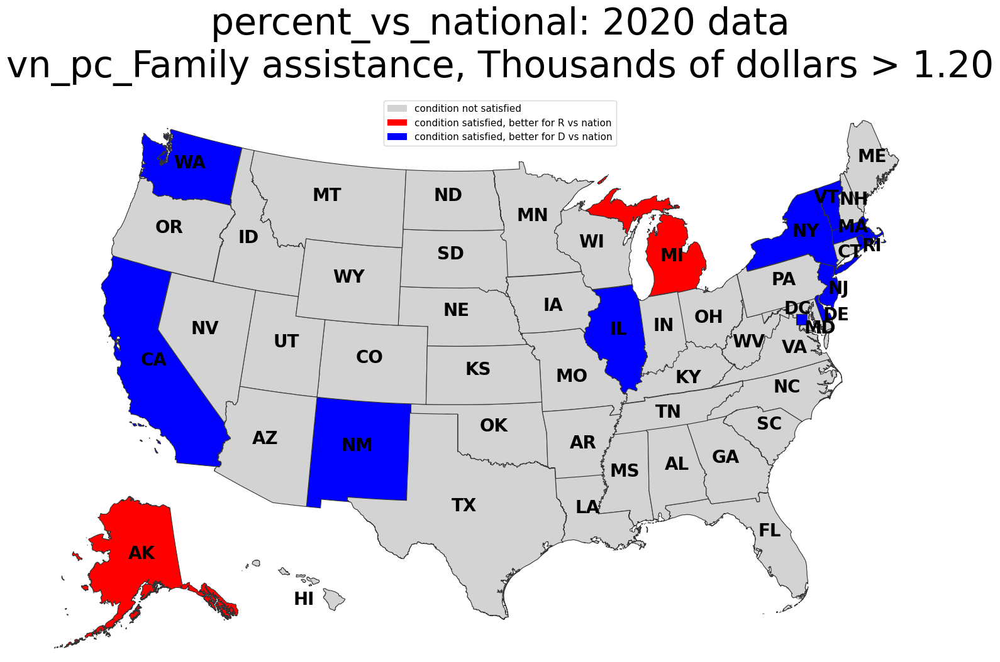

In [69]:
forshow=pd.DataFrame()
forshow['state']=[x[6:] for x in X_test.columns[-51:]]
forshow['condition']=[np.where(x in indeces, 1, 0).tolist() for x in np.arange(51)]
forshow['actual']=y_test_df[target]
forshow['color']=10*forshow['condition']+1*forshow['actual']
forshow.color=forshow.color.apply(get_color_expl)

visframe = gdf.merge(forshow,left_on='NAME',right_on='state')
visframe = visframe.to_crs(epsg=2163)

fig, ax = plt.subplots(1, figsize=(18, 14))
ax.axis('off')
ax.set_title(target+': 2020 data\n'+'vn_pc_Family assistance, Thousands of dollars > 1.20', fontdict={'fontsize': '42', 'fontweight' : '1'})

for row in visframe.itertuples():
    if row.STUSPS not in ['AK','HI','DC']:
        vf = visframe[visframe.STUSPS==row.STUSPS]
        c = vf.color
        vf.plot(color=c, linewidth=0.8, ax=ax, edgecolor='0.2')
            # add shortened state name
        if row.STUSPS in ['UT','IN', 'NH', 'AL','IL','CT','ME','IA','AR','KY','NC','SC','PA','NY']:
            x_text=vf.geometry.iloc[0].centroid.x-50000
        elif row.STUSPS in ['MI', 'NJ', 'MD','DE','FL','RI','VA']:
            x_text=vf.geometry.iloc[0].centroid.x
        else:
            x_text=vf.geometry.iloc[0].centroid.x-100000
                
        if row.STUSPS in ['MO','KY', 'TN','CT','RI','IA','AR','WV','DE','OH','NJ']:
            y_text=vf.geometry.iloc[0].centroid.y-50000
        elif row.STUSPS in ['MD', 'MI']:
            y_text=vf.geometry.iloc[0].centroid.y-100000
        else:
            y_text=vf.geometry.iloc[0].centroid.y
        ax.text(x=x_text, y=y_text, s=row.STUSPS, fontsize=20, fontweight='bold')
    
    # add a bigger square to the map instead of DC borders to make DC visible
dc_gdf = visframe[visframe.STUSPS=='DC']
dc_x_poly=dc_gdf.geometry.iloc[0].centroid.x
dc_x_text=dc_x_poly-100000
dc_y=dc_gdf.geometry.iloc[0].centroid.y
offset=30000
dc_gdf.geometry.iloc[0]=Polygon([(dc_x_poly-offset,dc_y-offset),(dc_x_poly-offset,dc_y+offset),
                                     (dc_x_poly+offset,dc_y+offset),(dc_x_poly+offset,dc_y-offset)])
dc_gdf.plot(color=dc_gdf.color.iloc[0], linewidth=0.8, ax=ax, edgecolor='0.2')
ax.text(x=dc_x_text, y=dc_y+30000, s='DC', fontsize=20, fontweight='bold')
    
    # add Alaska on a separate axis
akax = fig.add_axes([0.1, 0.17, 0.2, 0.19])
akax.axis('off')
    # polygon to clip some Aleutian islands for better visibility
polygon = Polygon([(-4000000,1400000),(-4000000, 4000000),(-1500000, 4000000),(-1500000, 1400000)])
alaska_gdf = visframe[visframe.STUSPS=='AK']
alaska_gdf=alaska_gdf.clip(polygon)
alaska_gdf.geometry=alaska_gdf.geometry.rotate(angle=45)
alaska_gdf.plot(color=alaska_gdf.color, linewidth=0.8,ax=akax, edgecolor='0.2')
akax.text(x=alaska_gdf.geometry.iloc[0].centroid.x-150000, y=alaska_gdf.geometry.iloc[0].centroid.y, 
              s='AK', fontsize=20, fontweight='bold')
    
    # add Hawaii on a separate axis
hiax = fig.add_axes([.28, 0.20, 0.1, 0.1])
hiax.axis('off')
    # polygon to clip Northwestern Hawaiian Islands for better visibility
hipolygon = Polygon([(-6000000,-1200000),(-6000000,-400000),(-5000000, -400000),(-5000000,-1200000)])
hawaii_gdf = visframe[visframe.STUSPS=='HI']
hawaii_gdf=hawaii_gdf.clip(hipolygon)
hawaii_gdf.geometry=hawaii_gdf.geometry.rotate(angle=45)
hawaii_gdf.plot(color=hawaii_gdf.color, linewidth=0.8,ax=hiax, edgecolor='0.2')
hiax.text(x=hawaii_gdf.geometry.iloc[0].centroid.x-150000, y=hawaii_gdf.geometry.iloc[0].centroid.y-100000, 
              s='HI', fontsize=20, fontweight='bold')

legend_elements = [Patch(facecolor=get_color_expl(0), label='condition not satisfied'),
                   Patch(facecolor=get_color_expl(10), label='condition satisfied, better for R vs nation'), 
                   Patch(facecolor=get_color_expl(11), label='condition satisfied, better for D vs nation')]
ax.legend(handles=legend_elements, loc='upper center',fontsize=11)
fig.savefig('lime'+'_-_'+'vn_pc_Family assistance'+'.png',dpi=400, bbox_inches="tight");

In [71]:
feature=X_test[['vn_pc_Military medical insurance benefits, Thousands of dollars']]
indeces=feature[feature['vn_pc_Military medical insurance benefits, Thousands of dollars']>1.42].index.tolist()
indeces

[0, 1, 5, 9, 10, 11, 16, 33, 36, 40, 41, 46, 50]

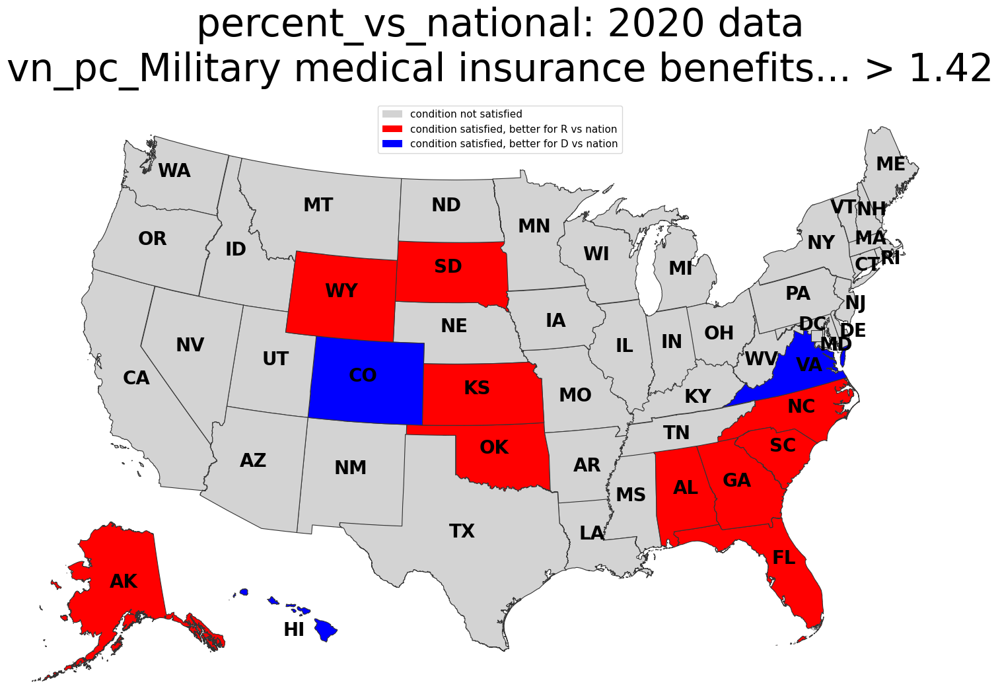

In [72]:
forshow=pd.DataFrame()
forshow['state']=[x[6:] for x in X_test.columns[-51:]]
forshow['condition']=[np.where(x in indeces, 1, 0).tolist() for x in np.arange(51)]
forshow['actual']=y_test_df[target]
forshow['color']=10*forshow['condition']+1*forshow['actual']
forshow.color=forshow.color.apply(get_color_expl)

visframe = gdf.merge(forshow,left_on='NAME',right_on='state')
visframe = visframe.to_crs(epsg=2163)

fig, ax = plt.subplots(1, figsize=(18, 14))
ax.axis('off')
ax.set_title(target+': 2020 data\n'+'vn_pc_Military medical insurance benefits... > 1.42', fontdict={'fontsize': '42', 'fontweight' : '1'})

for row in visframe.itertuples():
    if row.STUSPS not in ['AK','HI','DC']:
        vf = visframe[visframe.STUSPS==row.STUSPS]
        c = vf.color
        vf.plot(color=c, linewidth=0.8, ax=ax, edgecolor='0.2')
            # add shortened state name
        if row.STUSPS in ['UT','IN', 'NH', 'AL','IL','CT','ME','IA','AR','KY','NC','SC','PA','NY']:
            x_text=vf.geometry.iloc[0].centroid.x-50000
        elif row.STUSPS in ['MI', 'NJ', 'MD','DE','FL','RI','VA']:
            x_text=vf.geometry.iloc[0].centroid.x
        else:
            x_text=vf.geometry.iloc[0].centroid.x-100000
                
        if row.STUSPS in ['MO','KY', 'TN','CT','RI','IA','AR','WV','DE','OH','NJ']:
            y_text=vf.geometry.iloc[0].centroid.y-50000
        elif row.STUSPS in ['MD', 'MI']:
            y_text=vf.geometry.iloc[0].centroid.y-100000
        else:
            y_text=vf.geometry.iloc[0].centroid.y
        ax.text(x=x_text, y=y_text, s=row.STUSPS, fontsize=20, fontweight='bold')
    
    # add a bigger square to the map instead of DC borders to make DC visible
dc_gdf = visframe[visframe.STUSPS=='DC']
dc_x_poly=dc_gdf.geometry.iloc[0].centroid.x
dc_x_text=dc_x_poly-100000
dc_y=dc_gdf.geometry.iloc[0].centroid.y
offset=30000
dc_gdf.geometry.iloc[0]=Polygon([(dc_x_poly-offset,dc_y-offset),(dc_x_poly-offset,dc_y+offset),
                                     (dc_x_poly+offset,dc_y+offset),(dc_x_poly+offset,dc_y-offset)])
dc_gdf.plot(color=dc_gdf.color.iloc[0], linewidth=0.8, ax=ax, edgecolor='0.2')
ax.text(x=dc_x_text, y=dc_y+30000, s='DC', fontsize=20, fontweight='bold')
    
    # add Alaska on a separate axis
akax = fig.add_axes([0.1, 0.17, 0.2, 0.19])
akax.axis('off')
    # polygon to clip some Aleutian islands for better visibility
polygon = Polygon([(-4000000,1400000),(-4000000, 4000000),(-1500000, 4000000),(-1500000, 1400000)])
alaska_gdf = visframe[visframe.STUSPS=='AK']
alaska_gdf=alaska_gdf.clip(polygon)
alaska_gdf.geometry=alaska_gdf.geometry.rotate(angle=45)
alaska_gdf.plot(color=alaska_gdf.color, linewidth=0.8,ax=akax, edgecolor='0.2')
akax.text(x=alaska_gdf.geometry.iloc[0].centroid.x-150000, y=alaska_gdf.geometry.iloc[0].centroid.y, 
              s='AK', fontsize=20, fontweight='bold')
    
    # add Hawaii on a separate axis
hiax = fig.add_axes([.28, 0.20, 0.1, 0.1])
hiax.axis('off')
    # polygon to clip Northwestern Hawaiian Islands for better visibility
hipolygon = Polygon([(-6000000,-1200000),(-6000000,-400000),(-5000000, -400000),(-5000000,-1200000)])
hawaii_gdf = visframe[visframe.STUSPS=='HI']
hawaii_gdf=hawaii_gdf.clip(hipolygon)
hawaii_gdf.geometry=hawaii_gdf.geometry.rotate(angle=45)
hawaii_gdf.plot(color=hawaii_gdf.color, linewidth=0.8,ax=hiax, edgecolor='0.2')
hiax.text(x=hawaii_gdf.geometry.iloc[0].centroid.x-150000, y=hawaii_gdf.geometry.iloc[0].centroid.y-100000, 
              s='HI', fontsize=20, fontweight='bold')

legend_elements = [Patch(facecolor=get_color_expl(0), label='condition not satisfied'),
                   Patch(facecolor=get_color_expl(10), label='condition satisfied, better for R vs nation'), 
                   Patch(facecolor=get_color_expl(11), label='condition satisfied, better for D vs nation')]
ax.legend(handles=legend_elements, loc='upper center',fontsize=11)
fig.savefig('lime'+'_-_'+'vn_pc_Military medical insurance benefits'+'.png',dpi=400, bbox_inches="tight");

look at DC, where the value is obvious

In [73]:
state='District of Columbia'

instance_index = states_index_in_test.loc[state,'id']
lime_test_instance=X_test.iloc[instance_index].values

exp = explainer.explain_instance(
                                 # Instance to explain
                                 lime_test_instance, 
                                 # The prediction from black-box model
                                 RFC.predict_proba,
                                 # Use max 10 features
                                 num_features=10)

Intercept 0.4582089562523071
Prediction_local [0.67557331]
Right: 0.7175


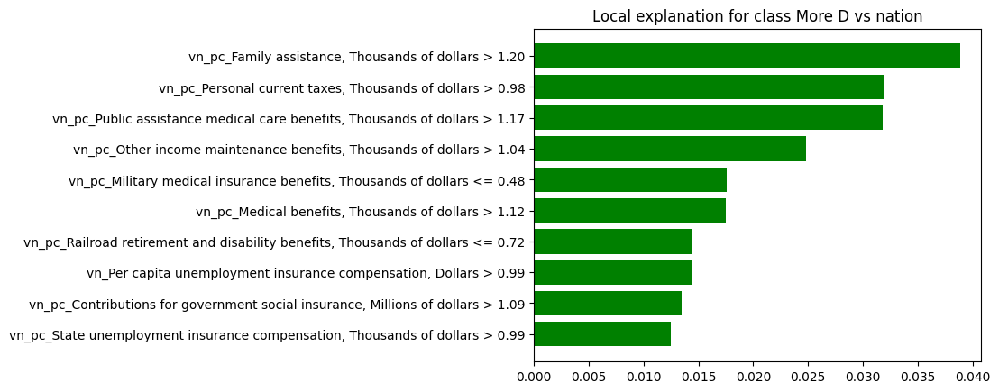

In [74]:
fig=exp.as_pyplot_figure();
fig.savefig('lime_'+state+'.png',dpi=400, bbox_inches="tight");

plot how some of those conditions divide the test set

In [75]:
feature=X_test[['vn_pc_Personal current taxes, Thousands of dollars']]
indeces=feature[feature['vn_pc_Personal current taxes, Thousands of dollars']>0.98].index.tolist()
indeces

[4, 5, 6, 8, 13, 20, 21, 23, 30, 32, 37, 46, 47]

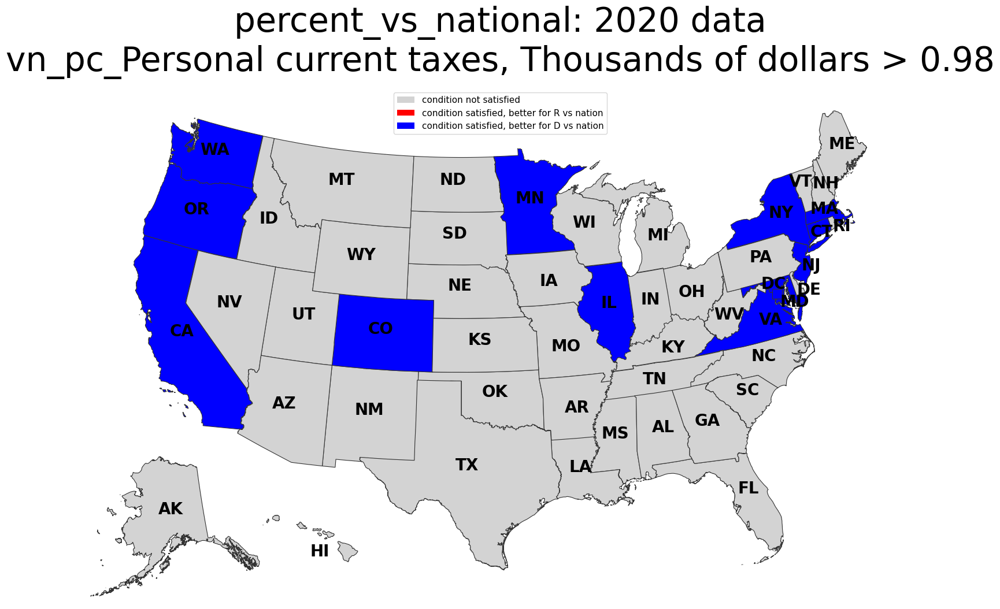

In [76]:
forshow=pd.DataFrame()
forshow['state']=[x[6:] for x in X_test.columns[-51:]]
forshow['condition']=[np.where(x in indeces, 1, 0).tolist() for x in np.arange(51)]
forshow['actual']=y_test_df[target]
forshow['color']=10*forshow['condition']+1*forshow['actual']
forshow.color=forshow.color.apply(get_color_expl)

visframe = gdf.merge(forshow,left_on='NAME',right_on='state')
visframe = visframe.to_crs(epsg=2163)

fig, ax = plt.subplots(1, figsize=(18, 14))
ax.axis('off')
ax.set_title(target+': 2020 data\n'+'vn_pc_Personal current taxes, Thousands of dollars > 0.98', fontdict={'fontsize': '42', 'fontweight' : '1'})

for row in visframe.itertuples():
    if row.STUSPS not in ['AK','HI','DC']:
        vf = visframe[visframe.STUSPS==row.STUSPS]
        c = vf.color
        vf.plot(color=c, linewidth=0.8, ax=ax, edgecolor='0.2')
            # add shortened state name
        if row.STUSPS in ['UT','IN', 'NH', 'AL','IL','CT','ME','IA','AR','KY','NC','SC','PA','NY']:
            x_text=vf.geometry.iloc[0].centroid.x-50000
        elif row.STUSPS in ['MI', 'NJ', 'MD','DE','FL','RI','VA']:
            x_text=vf.geometry.iloc[0].centroid.x
        else:
            x_text=vf.geometry.iloc[0].centroid.x-100000
                
        if row.STUSPS in ['MO','KY', 'TN','CT','RI','IA','AR','WV','DE','OH','NJ']:
            y_text=vf.geometry.iloc[0].centroid.y-50000
        elif row.STUSPS in ['MD', 'MI']:
            y_text=vf.geometry.iloc[0].centroid.y-100000
        else:
            y_text=vf.geometry.iloc[0].centroid.y
        ax.text(x=x_text, y=y_text, s=row.STUSPS, fontsize=20, fontweight='bold')
    
    # add a bigger square to the map instead of DC borders to make DC visible
dc_gdf = visframe[visframe.STUSPS=='DC']
dc_x_poly=dc_gdf.geometry.iloc[0].centroid.x
dc_x_text=dc_x_poly-100000
dc_y=dc_gdf.geometry.iloc[0].centroid.y
offset=30000
dc_gdf.geometry.iloc[0]=Polygon([(dc_x_poly-offset,dc_y-offset),(dc_x_poly-offset,dc_y+offset),
                                     (dc_x_poly+offset,dc_y+offset),(dc_x_poly+offset,dc_y-offset)])
dc_gdf.plot(color=dc_gdf.color.iloc[0], linewidth=0.8, ax=ax, edgecolor='0.2')
ax.text(x=dc_x_text, y=dc_y+30000, s='DC', fontsize=20, fontweight='bold')
    
    # add Alaska on a separate axis
akax = fig.add_axes([0.1, 0.17, 0.2, 0.19])
akax.axis('off')
    # polygon to clip some Aleutian islands for better visibility
polygon = Polygon([(-4000000,1400000),(-4000000, 4000000),(-1500000, 4000000),(-1500000, 1400000)])
alaska_gdf = visframe[visframe.STUSPS=='AK']
alaska_gdf=alaska_gdf.clip(polygon)
alaska_gdf.geometry=alaska_gdf.geometry.rotate(angle=45)
alaska_gdf.plot(color=alaska_gdf.color, linewidth=0.8,ax=akax, edgecolor='0.2')
akax.text(x=alaska_gdf.geometry.iloc[0].centroid.x-150000, y=alaska_gdf.geometry.iloc[0].centroid.y, 
              s='AK', fontsize=20, fontweight='bold')
    
    # add Hawaii on a separate axis
hiax = fig.add_axes([.28, 0.20, 0.1, 0.1])
hiax.axis('off')
    # polygon to clip Northwestern Hawaiian Islands for better visibility
hipolygon = Polygon([(-6000000,-1200000),(-6000000,-400000),(-5000000, -400000),(-5000000,-1200000)])
hawaii_gdf = visframe[visframe.STUSPS=='HI']
hawaii_gdf=hawaii_gdf.clip(hipolygon)
hawaii_gdf.geometry=hawaii_gdf.geometry.rotate(angle=45)
hawaii_gdf.plot(color=hawaii_gdf.color, linewidth=0.8,ax=hiax, edgecolor='0.2')
hiax.text(x=hawaii_gdf.geometry.iloc[0].centroid.x-150000, y=hawaii_gdf.geometry.iloc[0].centroid.y-100000, 
              s='HI', fontsize=20, fontweight='bold')

legend_elements = [Patch(facecolor=get_color_expl(0), label='condition not satisfied'),
                   Patch(facecolor=get_color_expl(10), label='condition satisfied, better for R vs nation'), 
                   Patch(facecolor=get_color_expl(11), label='condition satisfied, better for D vs nation')]
ax.legend(handles=legend_elements, loc='upper center',fontsize=11)
fig.savefig('lime'+'_-_'+'vn_pc_Personal current taxes'+'.png',dpi=400, bbox_inches="tight");

In [80]:
feature=X_test[['vn_pc_Public assistance medical care benefits, Thousands of dollars']]
indeces=feature[feature['vn_pc_Public assistance medical care benefits, Thousands of dollars']>1.17].index.tolist()
indeces

[1, 4, 7, 8, 17, 18, 21, 31, 32, 37, 38, 39, 45]

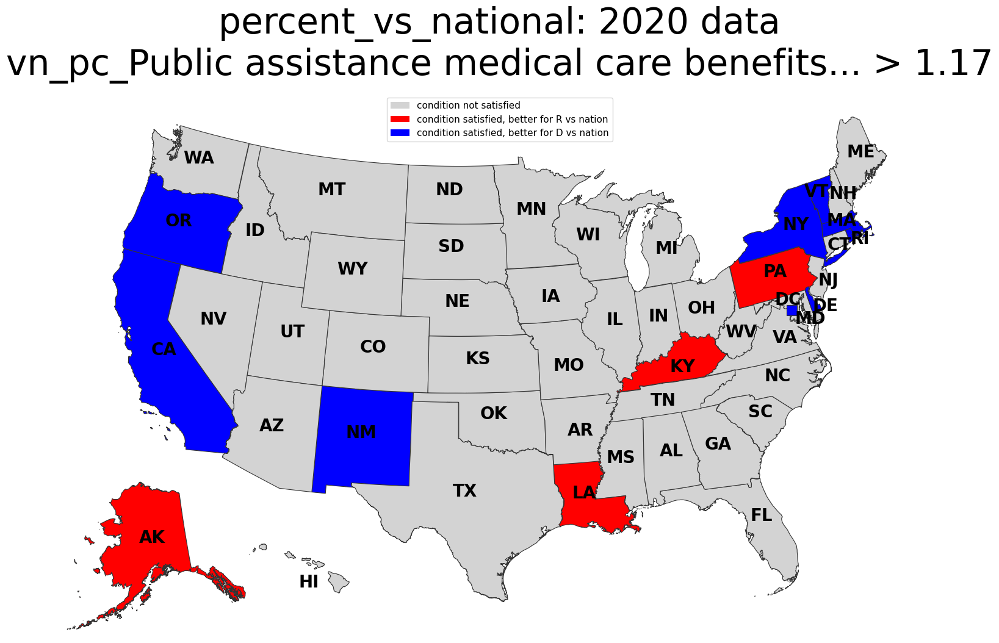

In [81]:
forshow=pd.DataFrame()
forshow['state']=[x[6:] for x in X_test.columns[-51:]]
forshow['condition']=[np.where(x in indeces, 1, 0).tolist() for x in np.arange(51)]
forshow['actual']=y_test_df[target]
forshow['color']=10*forshow['condition']+1*forshow['actual']
forshow.color=forshow.color.apply(get_color_expl)

visframe = gdf.merge(forshow,left_on='NAME',right_on='state')
visframe = visframe.to_crs(epsg=2163)

fig, ax = plt.subplots(1, figsize=(18, 14))
ax.axis('off')
ax.set_title(target+': 2020 data\n'+'vn_pc_Public assistance medical care benefits... > 1.17', fontdict={'fontsize': '42', 'fontweight' : '1'})

for row in visframe.itertuples():
    if row.STUSPS not in ['AK','HI','DC']:
        vf = visframe[visframe.STUSPS==row.STUSPS]
        c = vf.color
        vf.plot(color=c, linewidth=0.8, ax=ax, edgecolor='0.2')
            # add shortened state name
        if row.STUSPS in ['UT','IN', 'NH', 'AL','IL','CT','ME','IA','AR','KY','NC','SC','PA','NY']:
            x_text=vf.geometry.iloc[0].centroid.x-50000
        elif row.STUSPS in ['MI', 'NJ', 'MD','DE','FL','RI','VA']:
            x_text=vf.geometry.iloc[0].centroid.x
        else:
            x_text=vf.geometry.iloc[0].centroid.x-100000
                
        if row.STUSPS in ['MO','KY', 'TN','CT','RI','IA','AR','WV','DE','OH','NJ']:
            y_text=vf.geometry.iloc[0].centroid.y-50000
        elif row.STUSPS in ['MD', 'MI']:
            y_text=vf.geometry.iloc[0].centroid.y-100000
        else:
            y_text=vf.geometry.iloc[0].centroid.y
        ax.text(x=x_text, y=y_text, s=row.STUSPS, fontsize=20, fontweight='bold')
    
    # add a bigger square to the map instead of DC borders to make DC visible
dc_gdf = visframe[visframe.STUSPS=='DC']
dc_x_poly=dc_gdf.geometry.iloc[0].centroid.x
dc_x_text=dc_x_poly-100000
dc_y=dc_gdf.geometry.iloc[0].centroid.y
offset=30000
dc_gdf.geometry.iloc[0]=Polygon([(dc_x_poly-offset,dc_y-offset),(dc_x_poly-offset,dc_y+offset),
                                     (dc_x_poly+offset,dc_y+offset),(dc_x_poly+offset,dc_y-offset)])
dc_gdf.plot(color=dc_gdf.color.iloc[0], linewidth=0.8, ax=ax, edgecolor='0.2')
ax.text(x=dc_x_text, y=dc_y+30000, s='DC', fontsize=20, fontweight='bold')
    
    # add Alaska on a separate axis
akax = fig.add_axes([0.1, 0.17, 0.2, 0.19])
akax.axis('off')
    # polygon to clip some Aleutian islands for better visibility
polygon = Polygon([(-4000000,1400000),(-4000000, 4000000),(-1500000, 4000000),(-1500000, 1400000)])
alaska_gdf = visframe[visframe.STUSPS=='AK']
alaska_gdf=alaska_gdf.clip(polygon)
alaska_gdf.geometry=alaska_gdf.geometry.rotate(angle=45)
alaska_gdf.plot(color=alaska_gdf.color, linewidth=0.8,ax=akax, edgecolor='0.2')
akax.text(x=alaska_gdf.geometry.iloc[0].centroid.x-150000, y=alaska_gdf.geometry.iloc[0].centroid.y, 
              s='AK', fontsize=20, fontweight='bold')
    
    # add Hawaii on a separate axis
hiax = fig.add_axes([.28, 0.20, 0.1, 0.1])
hiax.axis('off')
    # polygon to clip Northwestern Hawaiian Islands for better visibility
hipolygon = Polygon([(-6000000,-1200000),(-6000000,-400000),(-5000000, -400000),(-5000000,-1200000)])
hawaii_gdf = visframe[visframe.STUSPS=='HI']
hawaii_gdf=hawaii_gdf.clip(hipolygon)
hawaii_gdf.geometry=hawaii_gdf.geometry.rotate(angle=45)
hawaii_gdf.plot(color=hawaii_gdf.color, linewidth=0.8,ax=hiax, edgecolor='0.2')
hiax.text(x=hawaii_gdf.geometry.iloc[0].centroid.x-150000, y=hawaii_gdf.geometry.iloc[0].centroid.y-100000, 
              s='HI', fontsize=20, fontweight='bold')

legend_elements = [Patch(facecolor=get_color_expl(0), label='condition not satisfied'),
                   Patch(facecolor=get_color_expl(10), label='condition satisfied, better for R vs nation'), 
                   Patch(facecolor=get_color_expl(11), label='condition satisfied, better for D vs nation')]
ax.legend(handles=legend_elements, loc='upper center',fontsize=11)
fig.savefig('lime'+'_-_'+'vn_pc_Public assistance medical care benefits'+'.png',dpi=400, bbox_inches="tight");